#### Import libraries

In [1]:
import math
import csv
import os
import copy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from matplotlib.ticker import StrMethodFormatter

#### Import ProcessEmbryo and check it's working (by printing version date)

In [2]:
import ProcessEmbryo
print(ProcessEmbryo.__version__)

25.06.04


#### Run stack processing

In [3]:
# indicate a name of stack folder in the same folder or give an absolute path
stack_path = os.path.join(os.getcwd(), '250320_stack0')
# stack_path = os.path.abspath(MANUAL_ABSOLUTE_PATH_STRING)

**vvv Builds stack from raw extraction files - only run when needed! vvv**

In [4]:
force_reprocess_stack = True

if force_reprocess_stack or not os.path.isfile(os.path.join(stack_path, 'processed.stack')):
    processed_stack = ProcessEmbryo.process_stack(stack_path, channels = 2, channel_metric = "MeanIntensity_warp")
    ProcessEmbryo.save_stack(processed_stack)


Processing 250320_stack0

Loading the lineage tree graph:
Lineage tree graph loaded successfully

Loading channel extractions:
Histone loaded
Signal_1 loaded

Reconstructing cell lineages:
Processing 250320_stack0 lineage 1 / 100
Processing 250320_stack0 lineage 2 / 100
Processing 250320_stack0 lineage 3 / 100
Processing 250320_stack0 lineage 4 / 100
Processing 250320_stack0 lineage 5 / 100
Processing 250320_stack0 lineage 6 / 100
Processing 250320_stack0 lineage 7 / 100
Processing 250320_stack0 lineage 8 / 100
Processing 250320_stack0 lineage 9 / 100
Processing 250320_stack0 lineage 10 / 100
Processing 250320_stack0 lineage 11 / 100
Processing 250320_stack0 lineage 12 / 100
Processing 250320_stack0 lineage 13 / 100
Processing 250320_stack0 lineage 14 / 100
Processing 250320_stack0 lineage 15 / 100
Processing 250320_stack0 lineage 16 / 100
Processing 250320_stack0 lineage 17 / 100
Processing 250320_stack0 lineage 18 / 100
Processing 250320_stack0 lineage 19 / 100
Processing 250320_sta

#### Set global configs

In [5]:
Z_isotropy_factor = 9.6 # rescaling factor for the Z coordinate
frames_per_hour = 4 # frames-to-hours conversion factor
zero_division_epsilon = 0.0001 # constant preventing division by zero
frames_per_hour = 4 # rescaling factor to convert frames to hours
division_line_style = ['black', (0, (2, 4)), 1] # plotting settings used for vertical division lines
deriv_thresh = 0.02

In [6]:
plot_path = os.path.join(stack_path, 'Plots')
if not os.path.exists(plot_path):
    os.mkdir(plot_path)

#### Load saved stack

In [7]:
stack = ProcessEmbryo.get_stack(os.path.join(stack_path, 'processed.stack'))

#### Check terminal cell IDs

In [8]:
IDs = []
for cell in stack[0]:
    IDs.append(cell[0][1])
IDs.sort()
print('Last frame:', stack[0][0][0][0])
print('Leaf cell IDs:', IDs)
print('Total reconstructed lineages:',len(IDs))

Last frame: 80
Leaf cell IDs: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 95, 99, 100, 102, 107, 108, 109, 496, 652]
Total reconstructed lineages: 97


#### Define supporting functions (will be moved into the main package later)

In [9]:
def cell_exists(search_stack_track, cell_ID, echo = True): # returns whether queried cell exists in the stack
    found = False
    for pair in search_stack_track:
        found = (pair[0] == cell_ID) or (pair[1] == cell_ID)
        if found:
            break
    if not found and echo:
        print('Cell ' + str(cell_ID[0]) + '_' + str(cell_ID[1]) + ' not found in the tree')
    return found

In [10]:
def minimal_rectangle(N):
    """
    Calculates the dimensions of a minimal X by Y rectangular grid that can contain N elements
    """
    X = int(round(math.sqrt(N), 0))
    Y = N // X
    
    if N % X > 0:
        Y += 1
    
    return X, Y

In [11]:
def colsel_by_fate(fate_name): # returns color string based of fate name
    if fate_name == 'ICM':
        color = 'purple'
    elif fate_name == 'TE':
        color = 'brown'
    else:
        color = 'black'
        print('Fate-based color selection failed, defaulted to ' + color)
    return color

In [12]:
def colsel_by_signal(signal_name): # returns color string based of signal name
    if signal_name == 'histone':
        color = 'darkgrey'
    elif signal_name == 'fucci':
        color = 'darkred'
    else:
        color = 'black'
        print('Fate-based color selection failed, defaulted to ' + color)
    return color

In [13]:
def smoothen_trace(raw_trace, method = "average", kernel_size = 1): # returns a smoothened version of a signal trace
    if kernel_size == 0:
        return raw_trace
    
    else:
        temp_trace = []
        for i in range(kernel_size):
            temp_trace.append(math.nan)
        for point in raw_trace:
            temp_trace.append(point)
        for i in range(kernel_size):
            temp_trace.append(math.nan)

        out_trace = []
        for i in range(kernel_size, len(raw_trace) + kernel_size, 1):
            cur_val = 0
            cur_kern = 0
            
            if method == "average":
                for j in range(i - kernel_size, i + kernel_size + 1, 1):
                    if not math.isnan(temp_trace[j]):
                        kern_weight = 1
                        cur_val += kern_weight * temp_trace[j]
                        cur_kern += kern_weight
                out_trace.append(cur_val / cur_kern)
                
            elif method == "inverse":
                for j in range(i - kernel_size, i + kernel_size + 1, 1):
                    if not math.isnan(temp_trace[j]):
                        kern_weight = 1 / (abs(i-j) + 1)
                        cur_val += kern_weight * temp_trace[j]
                        cur_kern += kern_weight
                out_trace.append(cur_val / cur_kern)
            
            else:
                raise ValueError("Invalid smoothing method requested")

        return out_trace

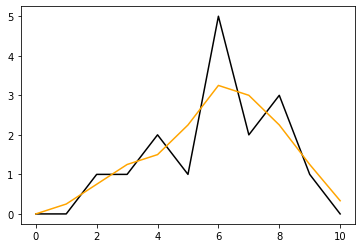

In [14]:
test_trace = [0,0,1,1,2,1,5,2,3,1,0]
test_smoothen_trace = smoothen_trace(test_trace, method = "inverse", kernel_size = 1)

plt.plot(test_trace, c='black')
plt.plot(test_smoothen_trace, c='orange')
plt.show()

#### Plot signal intensities for both channels in all cells

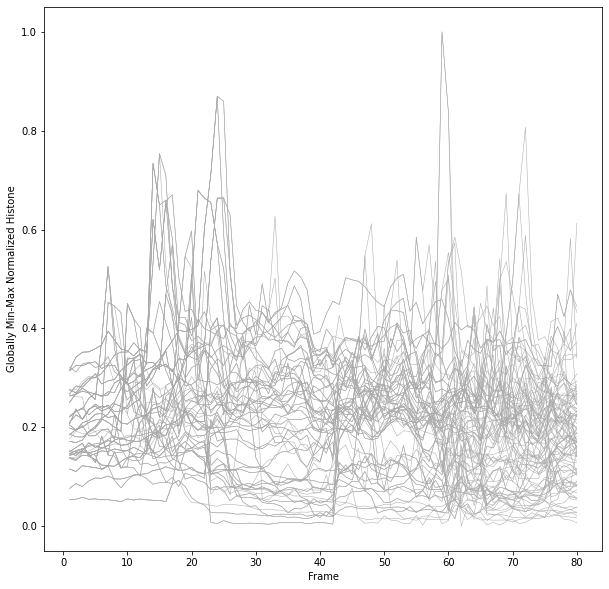

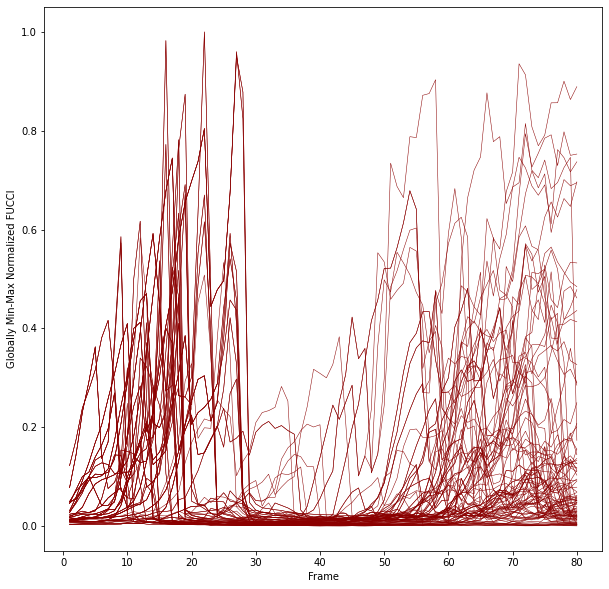

In [15]:
stack_name = stack[2][3][0]
stack_data = stack[0]
channels = len(stack[2][2][0])
channel_mins = stack[2][2][0]
channel_maxs = stack[2][2][1]

plot_channels = []
for c in range(channels):
    channel_tmp = []
    for lineage in stack_data:
        lineage_tmp = []
        for cell in lineage[1]:
            if (c + 5) <= (len(cell) - 1):
                temp = [cell[0], cell[c + 5]]
                lineage_tmp.append(temp)
        channel_tmp.append(lineage_tmp)
    plot_channels.append(channel_tmp)

plt.figure(figsize=(10, 10))
histone = plot_channels[0]
histone_traces = []
for trace in histone:
    temp_x = []
    temp_y = []
    for cell in trace:
        temp_x.append(cell[0])
        temp_y.append((cell[1] - channel_mins[0]) / (channel_maxs[0] - channel_mins[0] + zero_division_epsilon))
    histone_traces.append([temp_x, temp_y])
    
for trace in histone_traces:
    plt.plot(trace[0], trace[1], colsel_by_signal('histone'), linewidth = 0.5)
    
plt.ylabel("Globally Min-Max Normalized Histone")
plt.xlabel("Frame")
plt.show()

plt.figure(figsize=(10, 10))
fucci = plot_channels[1]
fucci_traces = []
for trace in fucci:
    temp_x = []
    temp_y = []
    for cell in trace:
        temp_x.append(cell[0])
        temp_y.append((cell[1] - channel_mins[1]) / (channel_maxs[1] - channel_mins[1] + zero_division_epsilon))
    fucci_traces.append([temp_x, temp_y])
    
for trace in fucci_traces:
    plt.plot(trace[0], trace[1], color = colsel_by_signal('fucci'), linewidth = 0.5)
    
plt.ylabel("Globally Min-Max Normalized FUCCI")
plt.xlabel("Frame")
plt.show()

In [16]:
print(stack[2][2][0])
print(stack[2][2][1])

[125.649379852778, 117.230766401432]
[639.024568695553, 816.376119191705]


#### Get manual fate calls

In [17]:
# get the list of cells with called fate
cells_called = []
with open(os.path.join(stack_path, 'fate_calls.csv'), newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',', quotechar='|')
    for row in reader:
        s1 = row[0].replace("'", '')
        s1_1 = int(s1[0:s1.find('_')])
        s1_2 = int(s1[s1.find('_') + 1 : len(s1)])
        if cell_exists(stack[1][0], [s1_1, s1_2]):
            cells_called.append([s1_1, s1_2, row[1]])
cells_called = np.array(cells_called)

# make a list of called fate
fate = []
for i in range(len(cells_called)):
    if cells_called[i][2] not in fate:
        fate.append(cells_called[i][2])

#### List all fates

In [18]:
print(fate)

['ICM', 'TE', 'death']


#### List all cells with fate calls

In [19]:
print(cells_called)

[['80' '2' 'ICM']
 ['80' '3' 'ICM']
 ['80' '4' 'ICM']
 ['80' '5' 'TE']
 ['80' '6' 'ICM']
 ['80' '7' 'TE']
 ['80' '8' 'ICM']
 ['80' '9' 'TE']
 ['80' '10' 'TE']
 ['80' '11' 'TE']
 ['80' '12' 'TE']
 ['80' '13' 'ICM']
 ['80' '14' 'ICM']
 ['80' '15' 'TE']
 ['80' '16' 'ICM']
 ['80' '17' 'TE']
 ['80' '18' 'TE']
 ['80' '19' 'ICM']
 ['80' '20' 'TE']
 ['80' '21' 'TE']
 ['80' '22' 'TE']
 ['80' '23' 'ICM']
 ['80' '24' 'ICM']
 ['80' '26' 'ICM']
 ['80' '27' 'ICM']
 ['80' '28' 'TE']
 ['80' '29' 'TE']
 ['80' '30' 'ICM']
 ['80' '31' 'TE']
 ['80' '32' 'ICM']
 ['80' '33' 'TE']
 ['80' '34' 'TE']
 ['80' '35' 'TE']
 ['80' '36' 'TE']
 ['80' '37' 'TE']
 ['80' '38' 'TE']
 ['80' '39' 'ICM']
 ['80' '40' 'TE']
 ['80' '41' 'TE']
 ['80' '42' 'TE']
 ['80' '43' 'TE']
 ['80' '44' 'TE']
 ['80' '45' 'TE']
 ['80' '46' 'TE']
 ['80' '47' 'TE']
 ['80' '48' 'TE']
 ['80' '49' 'TE']
 ['80' '50' 'TE']
 ['80' '51' 'TE']
 ['80' '52' 'TE']
 ['80' '53' 'TE']
 ['80' '54' 'TE']
 ['80' '55' 'ICM']
 ['80' '56' 'ICM']
 ['80' '57' 'TE']


#### Reconstruct and process fate-called cells

In [20]:
fate_data = []

for p in fate:
    temp_cells = []

    for i in range(len(cells_called)):
        if cells_called[i][2] == p:
            temp_cells.append([int(cells_called[i][0]), int(cells_called[i][1])])

    temp_data = []
    for cell in temp_cells:
        # reconstruct lineage from leaf
        temp_lin = ProcessEmbryo.lineage_reconstruct(stack[1][0], stack[2][0], cell[0], cell[1])
        # extract reconstructed lineage
        temp_data.append([cell, ProcessEmbryo.lineage_express(ProcessEmbryo.lineage_transform(temp_lin[0]), stack[1][1]), temp_lin[1]])

    fate_data.append([p, temp_data])

In [21]:
# print first fate name
print(fate_data[0][0])
# print first cell's [frame, ID]
print(fate_data[0][1][0][0])
# print cell's first frame data [frame, ID, centroidX, cenbtroidY, centroidZ, histone, fucci]
print(fate_data[0][1][0][1][0])
# print cell's division frames as a list of [frame, ID]
print(fate_data[0][1][0][2])

ICM
[80, 2]
[1, 1, 661.348909353855, 405.925104718515, 550.789971001027, 231.783706623306, 127.113650498677]
[[25, 21], [79, 16]]


#### Plot <u>globally</u> min-max normalized FUCCI traces

Showing plots for ICM


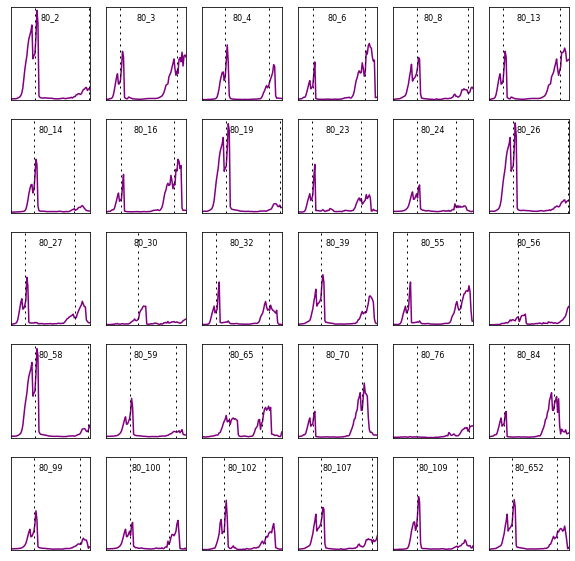

Showing plots for TE


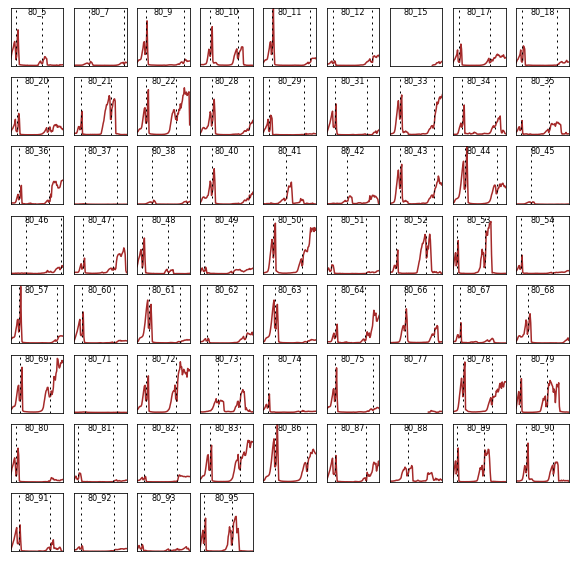

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


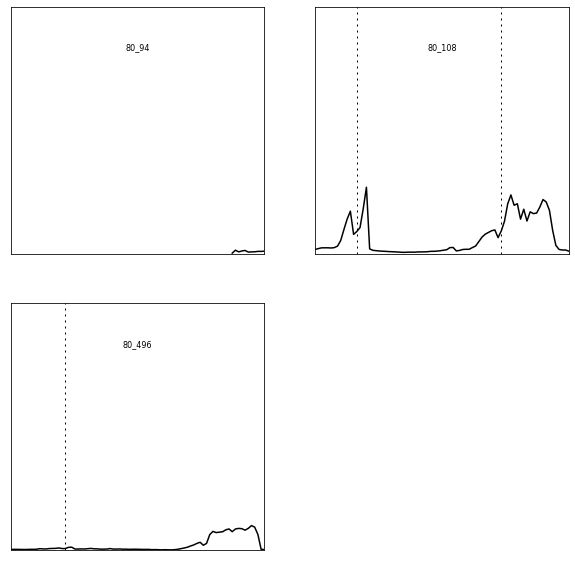

In [22]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
        plot_data.append([frame, fucci])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.plot(plot_data[i][0], (plot_data[i][1] - stack[2][2][0][1])/(stack[2][2][1][1] - stack[2][2][0][1] + zero_division_epsilon), c=colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    
    plt.show()
    cnt += 1

#### Plot <u>individually</u> min-max normalized FUCCI traces

Showing plots for ICM


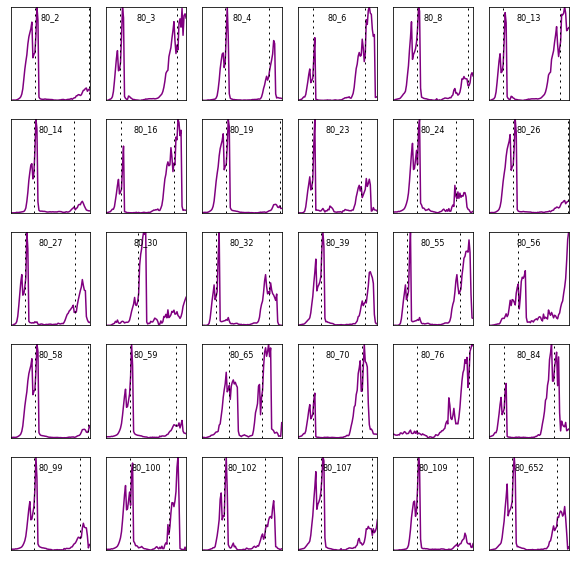

Showing plots for TE


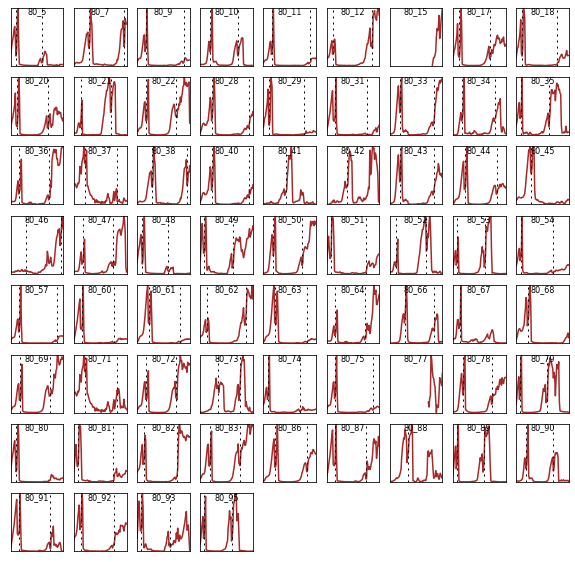

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


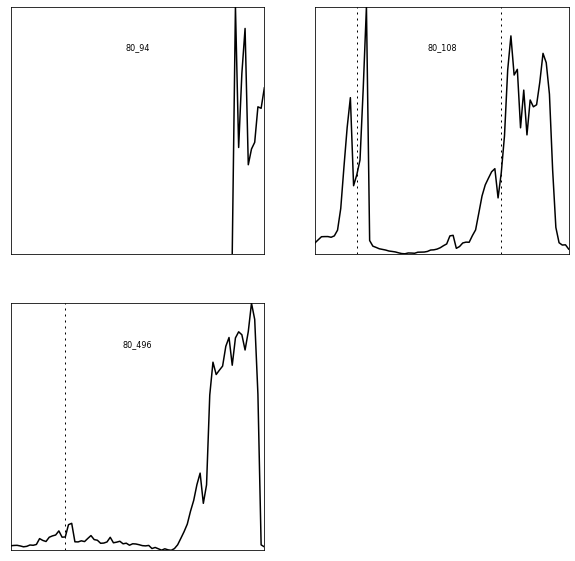

In [23]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)
save_data = True # save computed traces for further analysis

if save_data:
    indiv_norm_traces = []

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        fucci_min = stack[2][2][1][1] + 1
        fucci_max = stack[2][2][0][1] - 1
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
            if f[6] > fucci_max:
                fucci_max = f[6]
            if f[6] < fucci_min:
                fucci_min = f[6]
                
        fucci_out = []
        for f in fucci:
            fucci_out.append((f - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon))
            
        plot_data.append([frame, fucci_out])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    if save_data:
        tmp = []
        tmp.append(plot_data)
        if titles:
            tmp.append(names)
        if div_lines:
            tmp.append(divisions)
        indiv_norm_traces.append([fate[cnt], tmp])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.plot(plot_data[i][0], smoothen_trace(plot_data[i][1], method = 'inverse', kernel_size = 0), c = colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
            
    plt.show()
    cnt += 1

#### Plot <u>individually</u> min-max normalized FUCCI <u>derivative</u> traces 

Showing plots for ICM


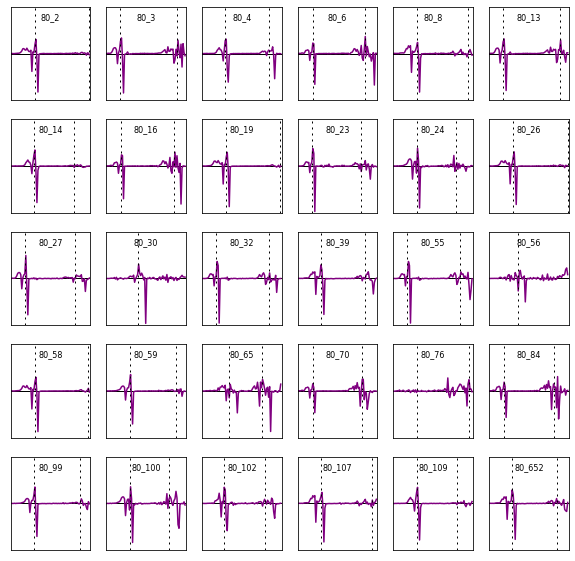

Showing plots for TE


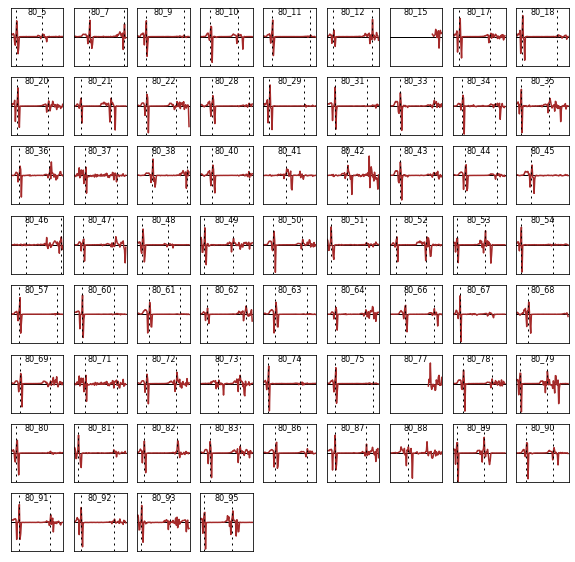

Showing plots for death
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


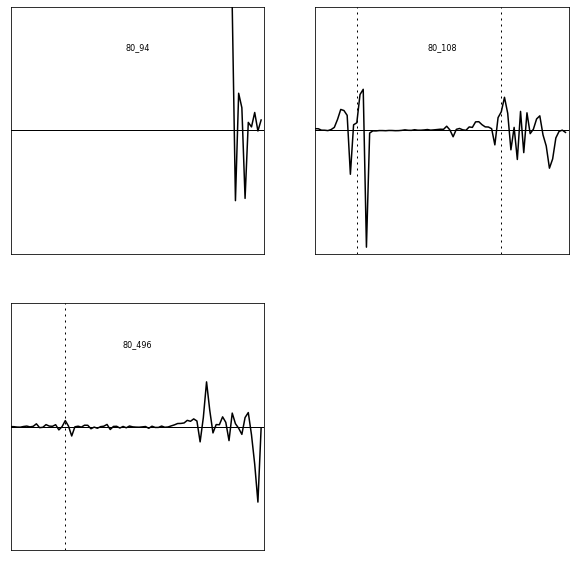

In [24]:
titles = True # add leaf cell IDs as plot titles
div_lines = True # add division lines (from lineage tree)
save_data = True # save computed traces for further analysis

if save_data:
    indiv_norm_derivs = []

cnt = 0
for p in fate:
    plot_data = []
    if titles:
        names = []
    if div_lines:
        divisions = []
        
    for cell in fate_data[cnt][1]:
        frame = []
        fucci = []
        fucci_min = stack[2][2][1][1] + 1
        fucci_max = stack[2][2][0][1] - 1
        for f in cell[1]:
            frame.append(f[0])
            fucci.append(f[6])
            if f[6] > fucci_max:
                fucci_max = f[6]
            if f[6] < fucci_min:
                fucci_min = f[6]
                
        fucci_der = []
        for i in range(len(fucci) - 1):
            temp1 = (fucci[i+1] - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon)
            temp2 = (fucci[i] - fucci_min)/(fucci_max - fucci_min + zero_division_epsilon)
            fucci_der.append(temp1 - temp2)
        trash = frame.pop()
        
        plot_data.append([frame, fucci_der])
        if titles:
            names.append(str(cell[0][0]) + '_' + str(cell[0][1]))
        if div_lines:
            divisions.append(cell[2])
    
    if save_data:
        tmp = []
        tmp.append(plot_data)
        if titles:
            tmp.append(names)
        if div_lines:
            tmp.append(divisions)
        indiv_norm_derivs.append([fate[cnt], tmp])
    
    print('Showing plots for ' + fate[cnt])
    
    plt.figure(figsize=(10, 10))
    N, M = minimal_rectangle(len(plot_data))
    for i in range(len(plot_data)):
        plt.subplot(N, M, i + 1)
        plt.xticks([])
        plt.yticks([])
        if titles:
            plt.title(names[i], fontsize = 8, y = 0.8)
        plt.ylim(-1, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.plot(plot_data[i][0], smoothen_trace(plot_data[i][1], method = 'inverse', kernel_size = 0), c = colsel_by_fate(fate[cnt]))
        if div_lines:
            for division in divisions[i]:
                plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        
    plt.show()
    cnt += 1

In [25]:
# print fate name
print(indiv_norm_traces[0][0])
# print first cell's frames
print(indiv_norm_traces[0][1][0][0][0])
# print first cell's individually normalized fucci intensities
print(indiv_norm_traces[0][1][0][0][1])
# print leaf cell names
print(indiv_norm_traces[0][1][1])
# print cell divisions
print(indiv_norm_traces[0][1][2])

ICM
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]
[0.0, 0.0015659237062130736, 0.003432574117028785, 0.00428819062792037, 0.0032331740714598807, 0.0035511399397786204, 0.006569372367496772, 0.011120153472124791, 0.017960438694355124, 0.025570010926104142, 0.039089583895090214, 0.06770692981574486, 0.12426935017498657, 0.22654305747751022, 0.33283290598636706, 0.41387553572654584, 0.4864040000509189, 0.6015181137175747, 0.6780944995107312, 0.7227953014874853, 0.7647972035792516, 0.8356490346545732, 0.45489012925004957, 0.49039306748481654, 0.5101015353018163, 0.6984626671042263, 0.999999848775411, 0.8566877527928021, 0.03597393998361182, 0.01899712243609656, 0.01442586479743118, 0.01265432169951076, 0.011455659224095131, 0.01

#### Plot a given cell's FUCCI trace along the derivative trace

In [26]:
def plot_cell_double_trace(trace1, trace2, cell_ID, smoothing = ['inverse', 0]): # plots individually normalized trace and the derivative trace of quiried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in trace1:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    plt.figure(figsize=(10, 10))
    
    plt.subplot(2, 1, 1)
    plt.plot(trace1[fate_index][1][0][cell_index][0], smoothen_trace(trace1[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1]), c = colsel_by_fate(fate[fate_index]), linewidth = 3)
    for division in trace1[fate_index][1][2][cell_index]:
        plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    plt.ylim(0, 1)
    plt.xlim(stack[2][1][0], stack[2][1][1])
    plt.ylabel('Individually Min-MAx Normallized FUCCI')
    
    plt.subplot(2, 1, 2)
    plt.plot(trace2[fate_index][1][0][cell_index][0], smoothen_trace(trace2[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1]), c = colsel_by_fate(fate[fate_index]), linewidth = 3)
    for division in trace2[fate_index][1][2][cell_index]:
        plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
    plt.axhline(y = 0, color = 'k', linewidth = 1)
    plt.ylim(-1, 1)
    plt.xlim(stack[2][1][0], stack[2][1][1])
    plt.ylabel('Individually Min-MAx Normallized FUCCI Derivative')
    plt.xlabel('Frame')
    plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)
    
    plt.show()

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


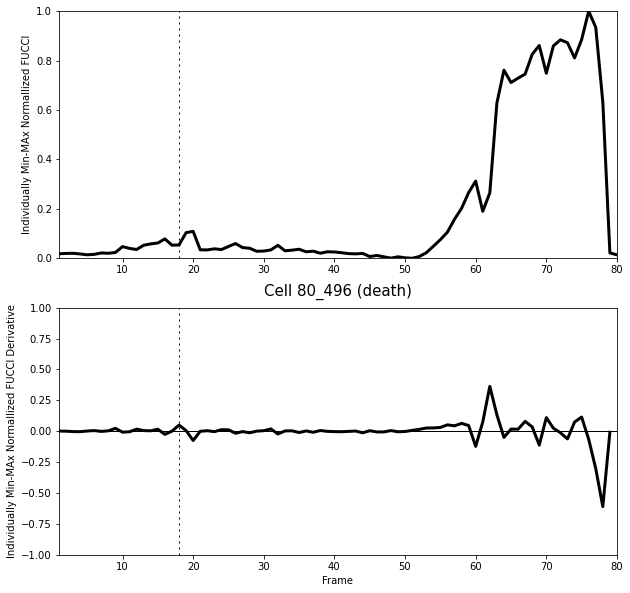

In [27]:
target_cell_ID = [80, 496] # desired cell's [frame, ID]
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID)

#### Inverse kernel smoothing

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


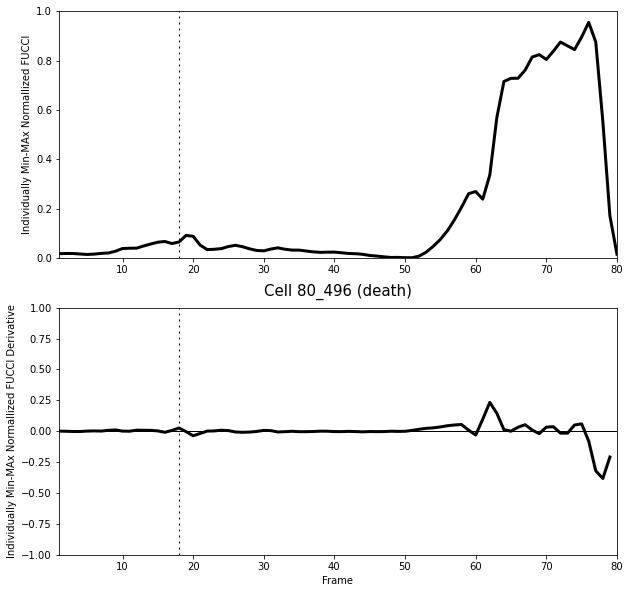

In [56]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['inverse', 1])

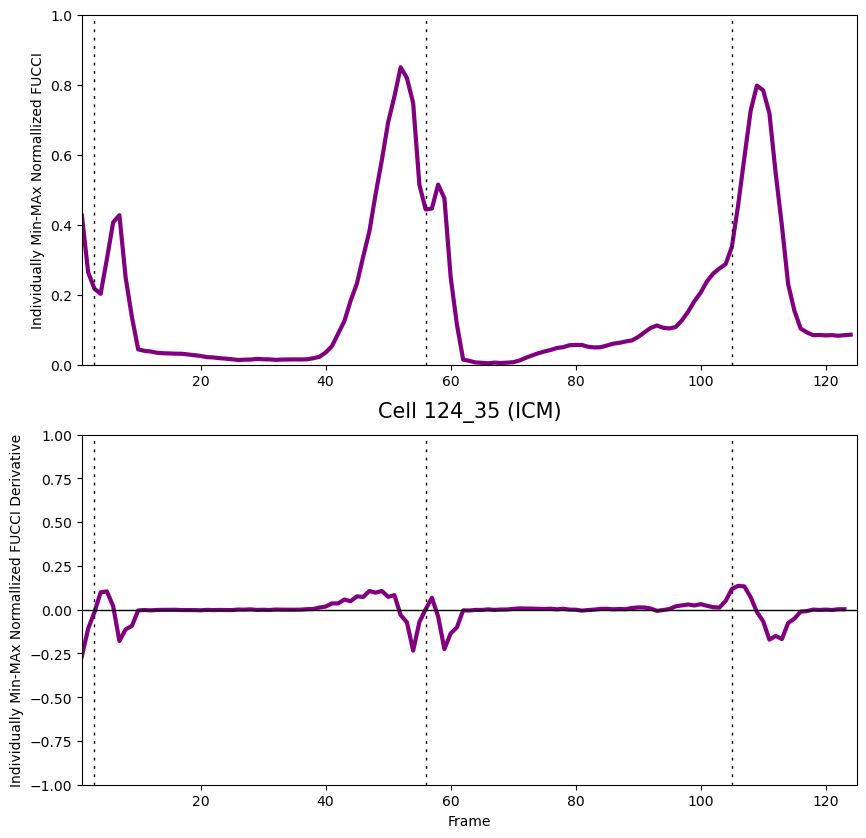

In [37]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['inverse', 2])

#### Averaging kernel smoothing

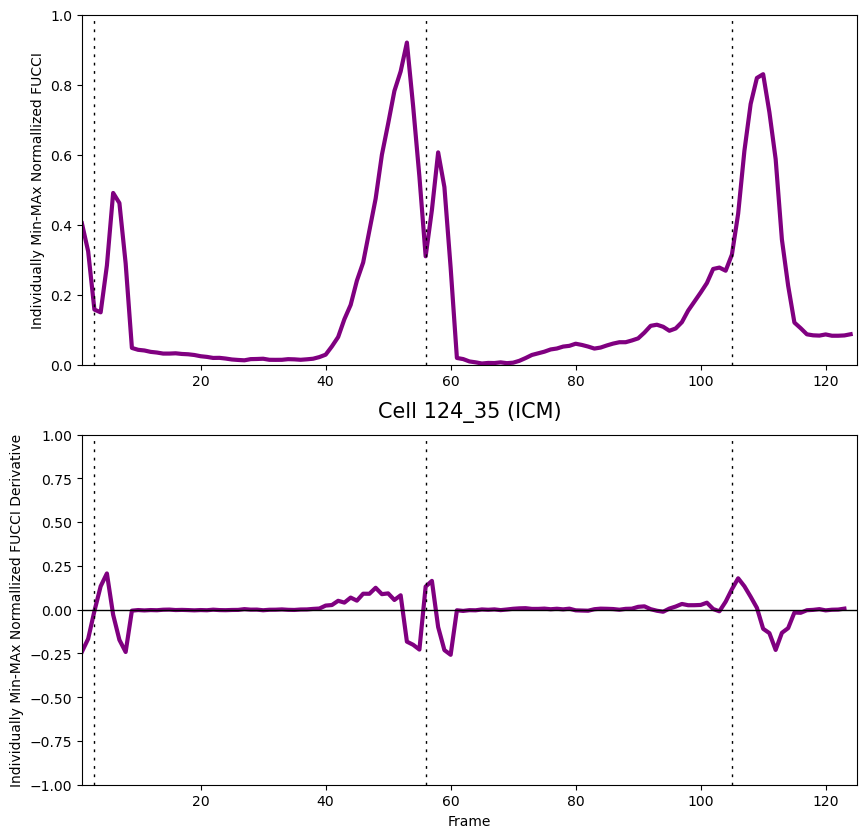

In [38]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['average', 1])

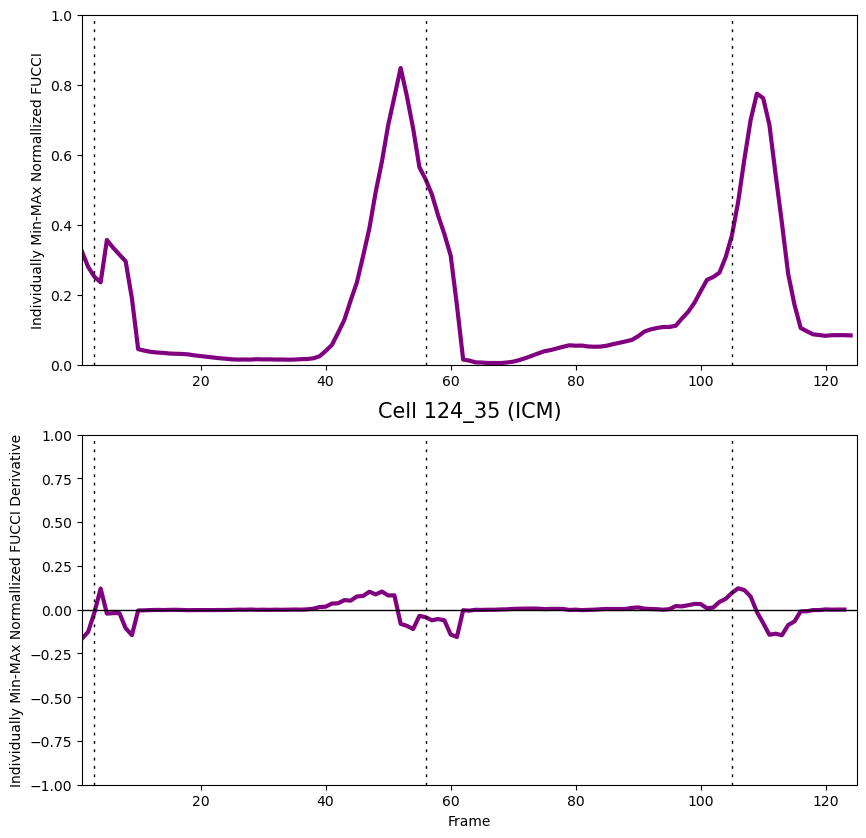

In [39]:
plot_cell_double_trace(indiv_norm_traces, indiv_norm_derivs, target_cell_ID, smoothing = ['average', 2])

In [50]:
print(indiv_norm_derivs[0][1][0][0])

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123], [-0.48165293860912817, 0.00017970880253048716, -0.017619800784039602, -0.006376941244632617, 0.425509211427488, 0.20276991360225716, -0.7150608789941132, -0.004662091663923257, -0.004997205982638281, -0.006403407316798539, 0.005658197346348551, -0.01110090291527684, -0.00036661856534293477, 0.0025306611392849065, -0.002100768535652789, 0.0019588866501229346, -0.005529705537571775, 0.0008534199275482407, -0.0015845888211599816, -0.00975467305112769, 0.005685710851374887, -0.004951027119

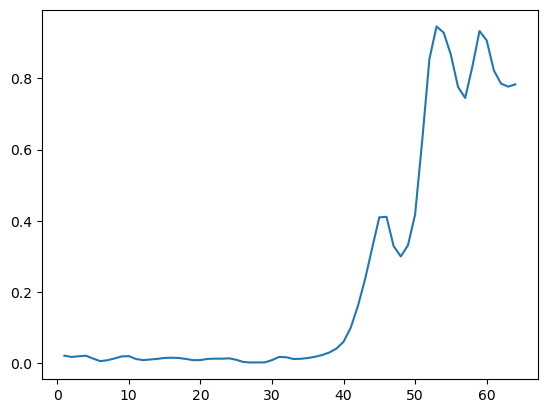

In [26]:
test_trace = indiv_norm_traces[0][1][0][0]
test_smooth_trace = smoothen_trace(test_trace[1], method='inverse', kernel_size=1)
plt.plot(test_trace[0], test_smooth_trace)

In [31]:
print(indiv_norm_traces[0][1][2][0])

[[43, 9], [92, 12]]


In [29]:
# save out all derivative measurements
all_derivs = []
for indiv_fate in indiv_norm_derivs:
    for cell in indiv_fate[1][0]:
        for point in cell[1]:
            all_derivs.append(point)

Text(0, 0.5, 'Occurances')

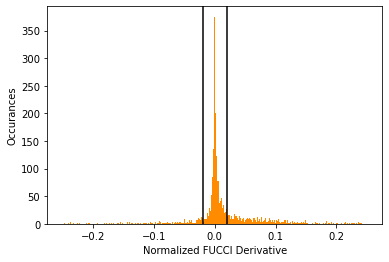

In [30]:
plt.hist(all_derivs, bins=1000, range=(-0.25, 0.25), color='darkorange')
plt.axvline(x = -1 * deriv_thresh, c = 'black')
plt.axvline(x = deriv_thresh, c = 'black')
plt.xlabel('Normalized FUCCI Derivative')
plt.ylabel('Occurances')

In [47]:
def annotate_division(raw_traces, deriv_traces, cell_ID, division_round = 64, smoothing = ['inverse', 1], makeplots = False, savefig = [False, 'null']):
    # find and format data of the queried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in raw_traces:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    temp_frames = raw_traces[fate_index][1][0][cell_index][0]
    temp_smooth = smoothen_trace(raw_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_derivs = smoothen_trace(deriv_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_divs = raw_traces[fate_index][1][2][cell_index]
    
    # annotate trace features
    if division_round == 128:
        division_index = 1
    elif division_round == 64:
        division_index = 0
    else:
        print('ERROR: Non-valid division request')
        return [-1, -1, -1, -1]
    
    if len(temp_divs) == 0:
        print('ERROR: No divisions in requested trace')
        return [-1, -1, -1, -1]
    
    if (division_index + 1) > len(temp_divs):
        print('ERROR: Requested division does not occur in requested trace')
        return [-1, -1, -1, -1]
    
    div_frame = temp_divs[division_index][0]
    div_frame_index = temp_frames.index(div_frame)
    
    permit = 25
    pre_div_peak = [-1, -999]
    pre_div_dip = [-1, 999]
    for i in range(max(div_frame_index - permit, 0), div_frame_index - 1, 1):
        if temp_smooth[i] > pre_div_peak[1]:
            pre_div_peak[0] = i
            pre_div_peak[1] = temp_smooth[i]
        if temp_derivs[i] < pre_div_dip[1]:
            pre_div_dip[0] = i
            pre_div_dip[1] = temp_derivs[i]
    
    post_div_peak = [-1, -999]
    post_div_dip = [-1, 999]
    for i in range(div_frame_index + 1, min(div_frame_index + permit, len(temp_frames) - 1), 1):
        if temp_smooth[i] > post_div_peak[1]:
            post_div_peak[0] = i
            post_div_peak[1] = temp_smooth[i]
        if temp_derivs[i] < post_div_dip[1]:
            post_div_dip[0] = i
            post_div_dip[1] = temp_derivs[i]
    
    mitotic_dip = [-1, 999]
    for i in range(pre_div_peak[0], post_div_peak[0], 1):
        if temp_smooth[i] < mitotic_dip[1]:
            mitotic_dip[0] = i
            mitotic_dip[1] = temp_smooth[i]
    
    pre_div_thresh = [-1, False]
    i = max(div_frame_index - permit, 0)
    while not pre_div_thresh[1] and i < div_frame_index:
        if temp_derivs[i] >= deriv_thresh:
            pre_div_thresh[1] = True
            pre_div_thresh[0] = i
        i += 1
    
    post_div_thresh = [-1, False]
    i =  post_div_dip[0]
    while not post_div_thresh[1] and i < min(div_frame_index + permit, len(temp_derivs) - 1):
        if temp_derivs[i] >= -1 * deriv_thresh:
            post_div_thresh[1] = True
            post_div_thresh[0] = i
        i += 1
    
    # make annotated plots
    if makeplots:
        plt.figure(figsize=(10, 10))

        plt.subplot(2, 1, 1)
        plt.plot(temp_frames, temp_smooth, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        plt.axvline(x = temp_frames[pre_div_peak[0]], c = 'green')
        #plt.axvline(x = temp_frames[pre_div_dip[0] + 1], c = 'red') 
        plt.axvline(x = temp_frames[post_div_peak[0]], c = 'green') 
        #plt.axvline(x = temp_frames[post_div_dip[0] + 1], c = 'red') 
        if pre_div_thresh[1]:
            plt.axvline(x = temp_frames[pre_div_thresh[0]], c = 'blue')
        if post_div_thresh[1]:
            plt.axvline(x = temp_frames[post_div_thresh[0]], c = 'blue')
        plt.axvline(x = temp_frames[mitotic_dip[0]], c = 'yellow')

        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI')

        plt.subplot(2, 1, 2)
        plt.plot(deriv_traces[fate_index][1][0][cell_index][0], temp_derivs, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        #plt.axvline(x = temp_frames[pre_div_peak[0] - 1], c = 'green')
        plt.axvline(x = temp_frames[pre_div_dip[0]], c = 'red') 
        #plt.axvline(x = temp_frames[post_div_peak[0] - 1], c = 'green') 
        plt.axvline(x = temp_frames[post_div_dip[0]], c = 'red')
        if pre_div_thresh[1]:
            plt.axvline(x = temp_frames[pre_div_thresh[0]], c = 'blue')
        if post_div_thresh[1]:
            plt.axvline(x = temp_frames[post_div_thresh[0]], c = 'blue')

        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.axhline(y = deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = -1 * deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.ylim(-1, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI Derivative')
        plt.xlabel('Frame')
        plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)

        # save out the plots
        if savefig[0]:
            temp_name = fate[fate_index] + '_' + cell_name + '_labeled_' + str(division_round) + '.png'
            plt.savefig(os.path.join(savefig[1], temp_name))

        plt.show()
    
    return [div_frame, temp_frames[pre_div_thresh[0]], temp_frames[mitotic_dip[0]], temp_frames[post_div_thresh[0]]]

In [48]:
test_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, [80, 16])

In [49]:
print(fate)

['ICM', 'TE', 'death']


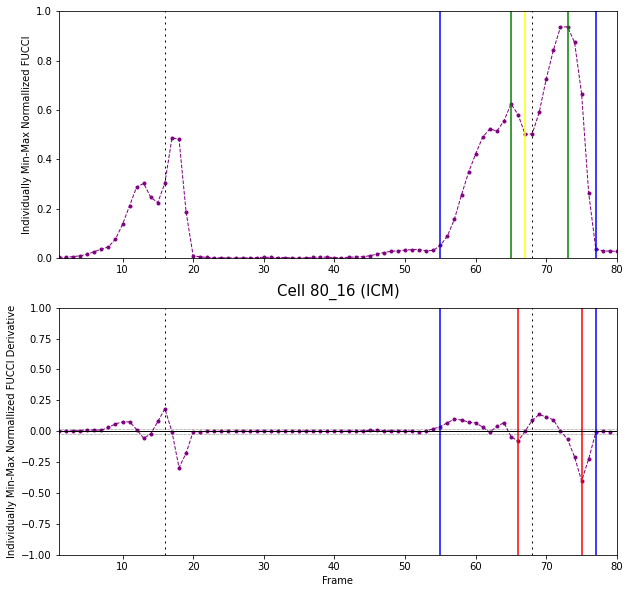

In [34]:
test_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, [80, 16], division_round = 128, makeplots = True, savefig = [False, plot_path])

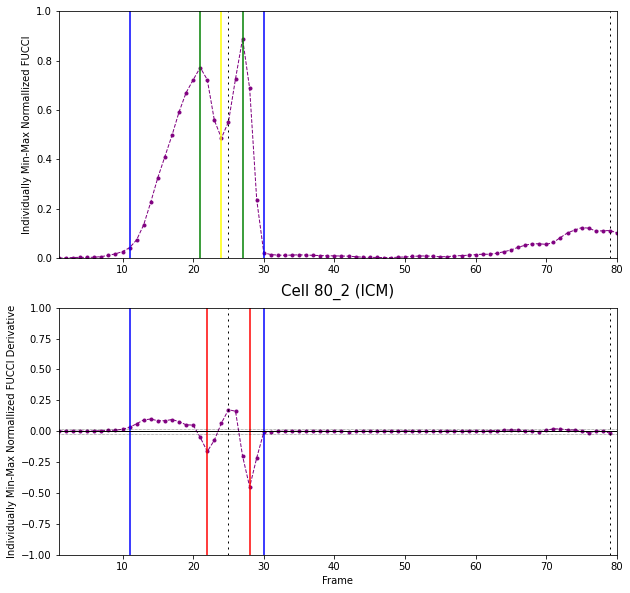

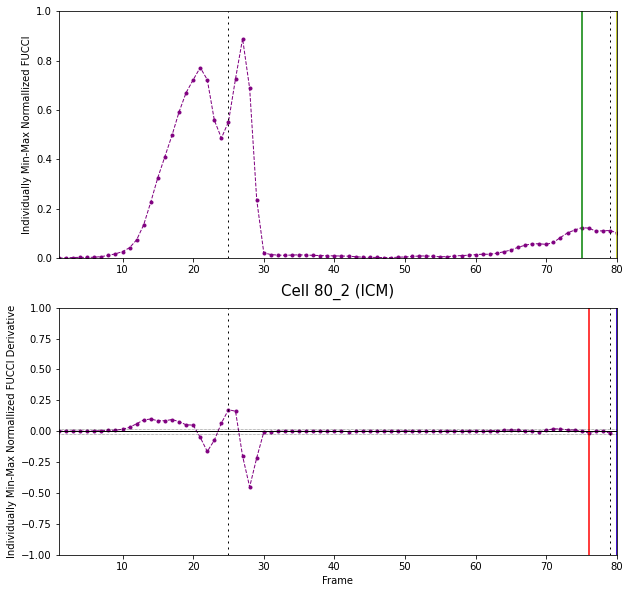

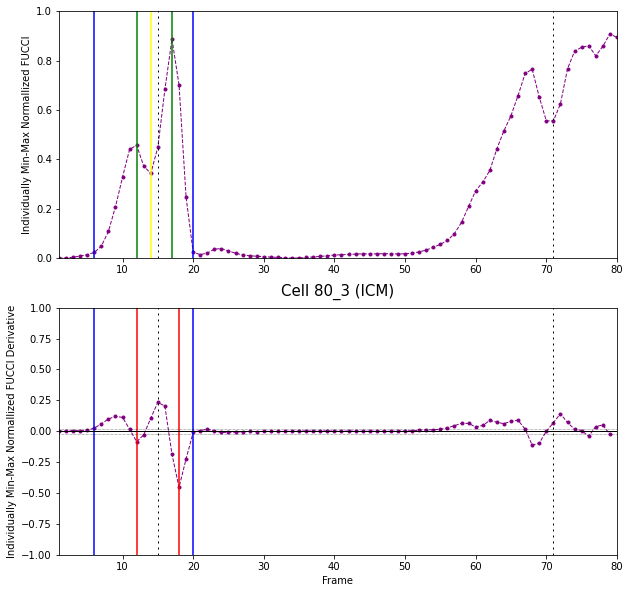

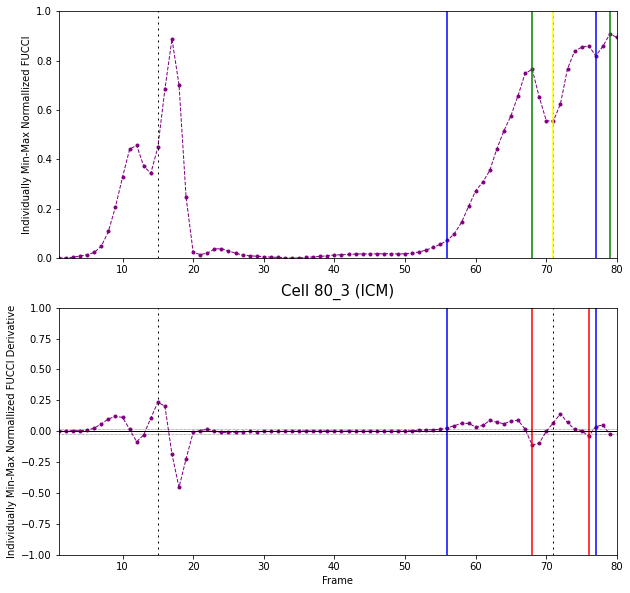

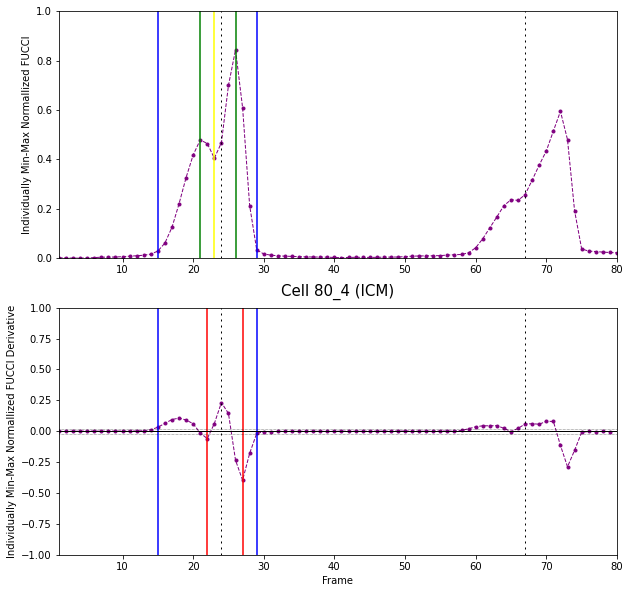

...

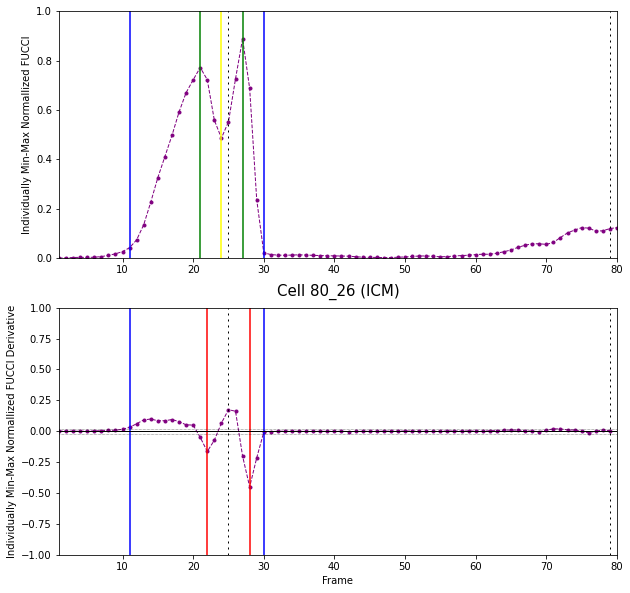

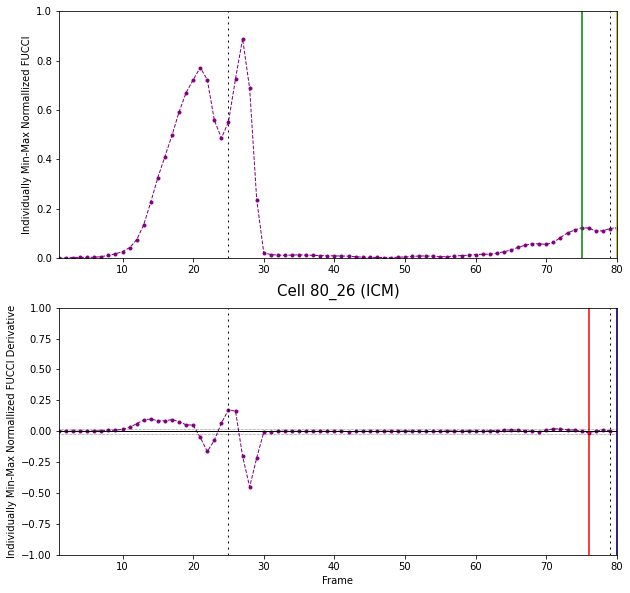

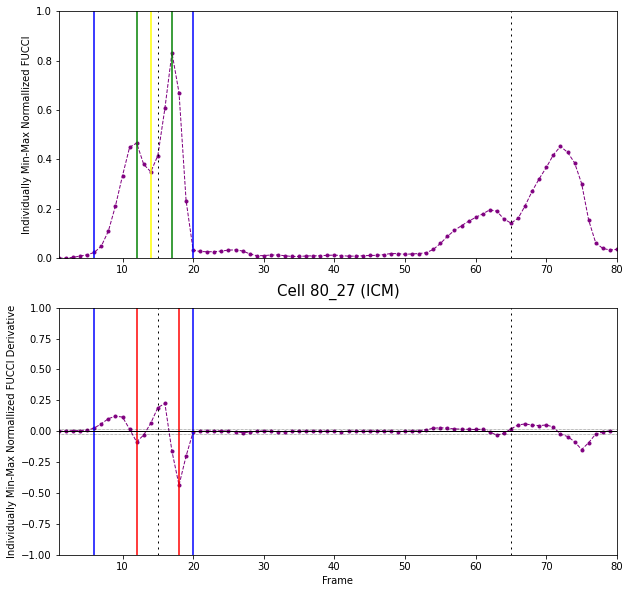

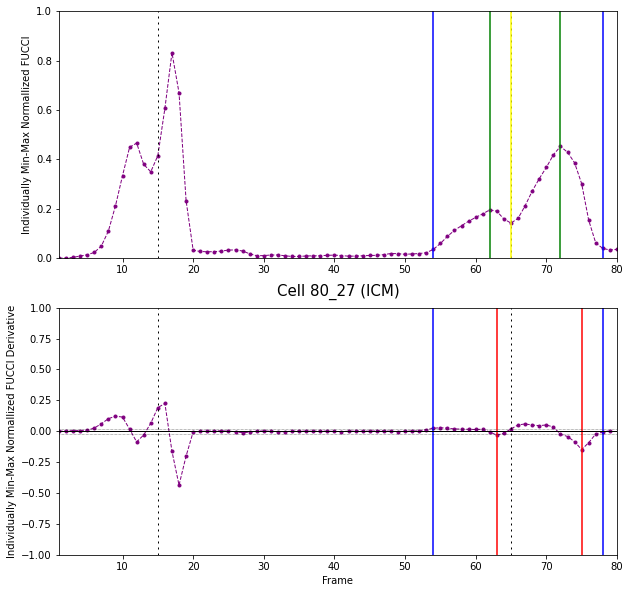

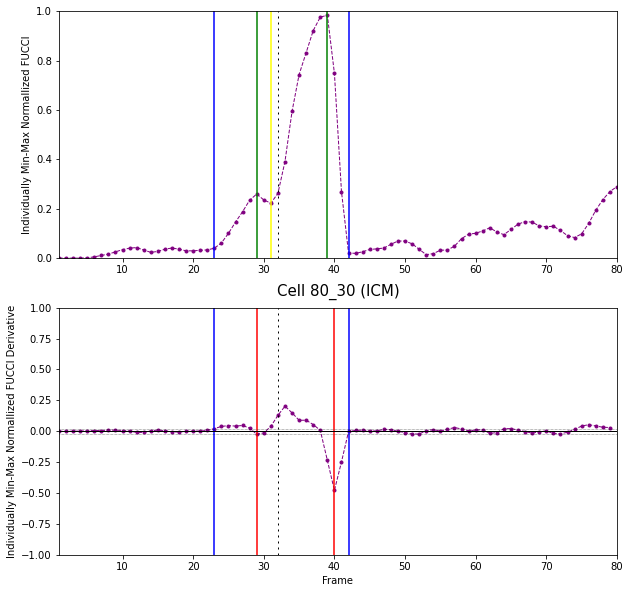

ERROR: Requested division does not occur in requested trace


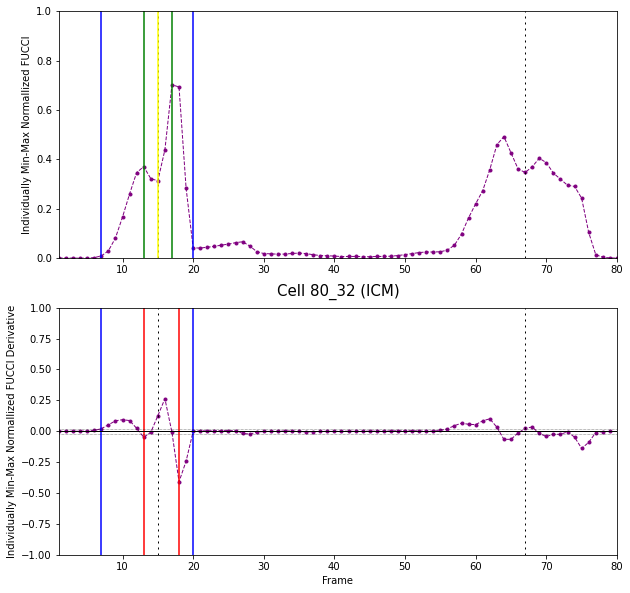

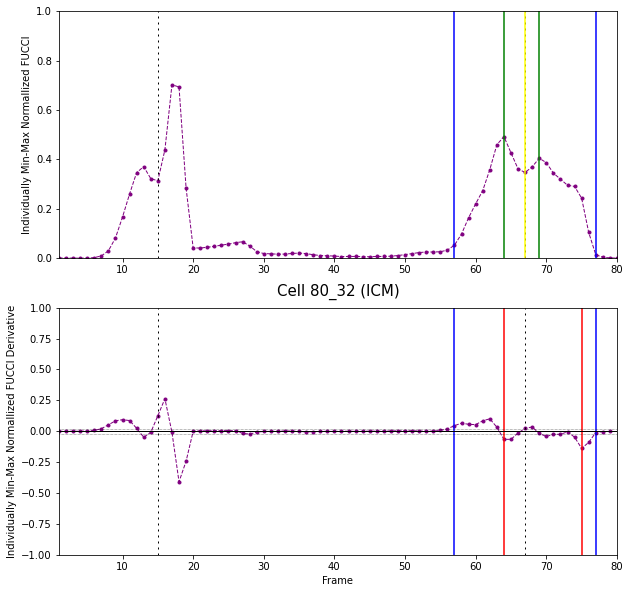

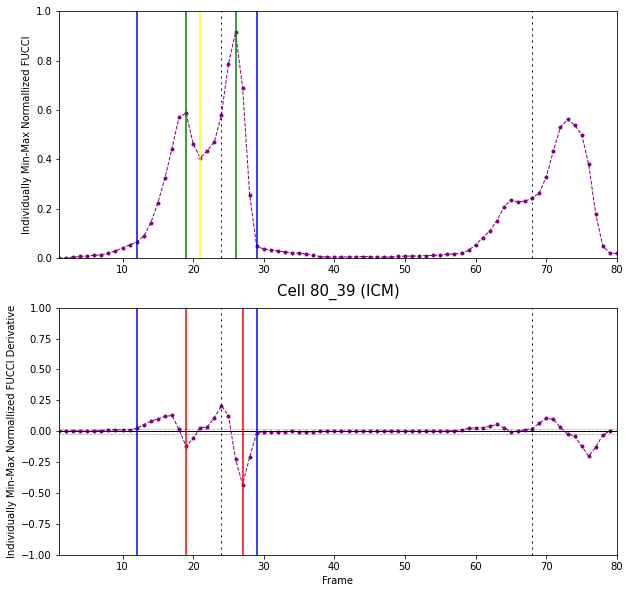

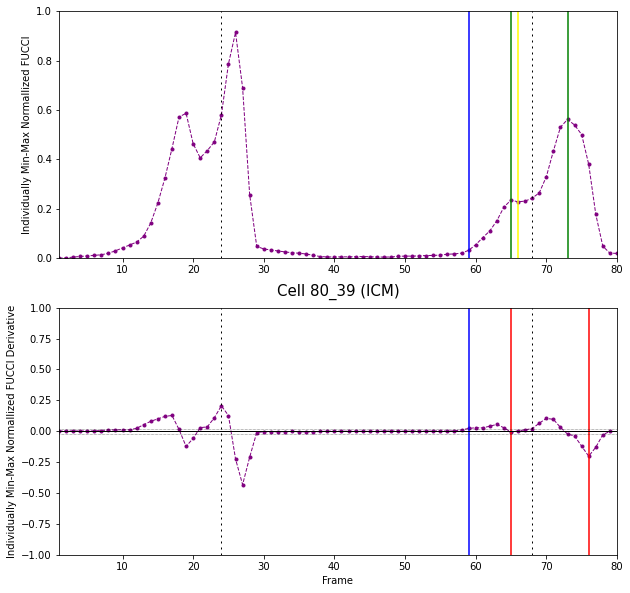

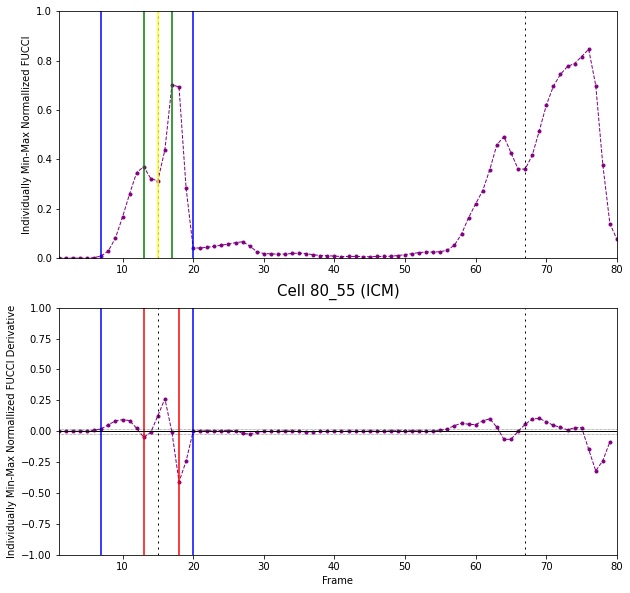

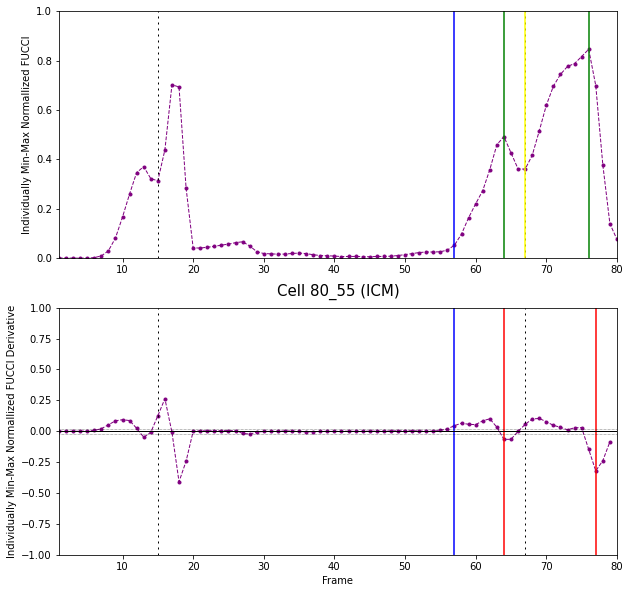

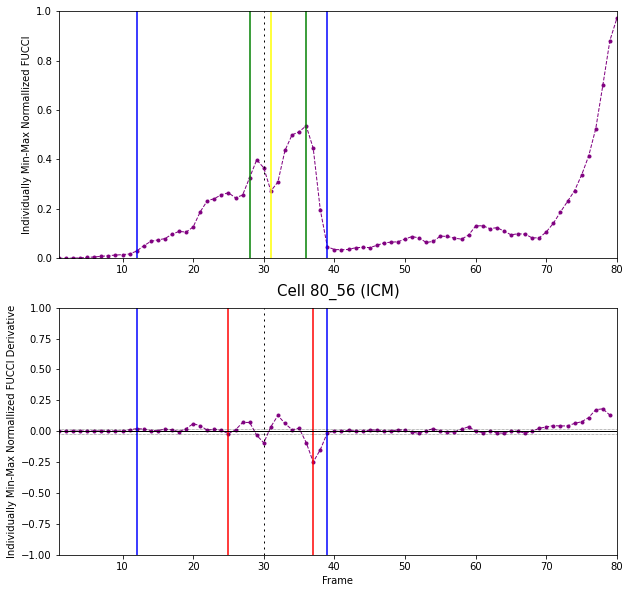

ERROR: Requested division does not occur in requested trace


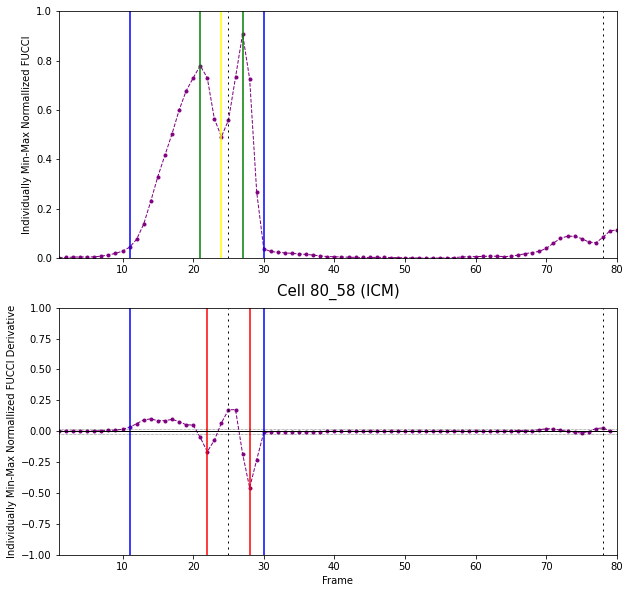

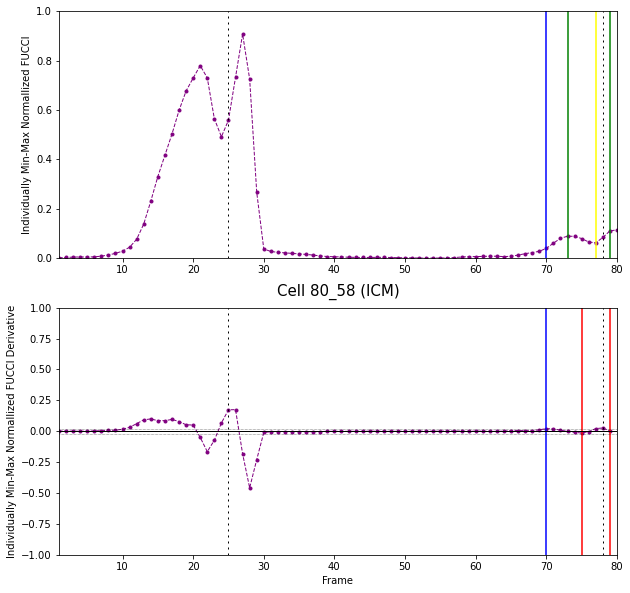

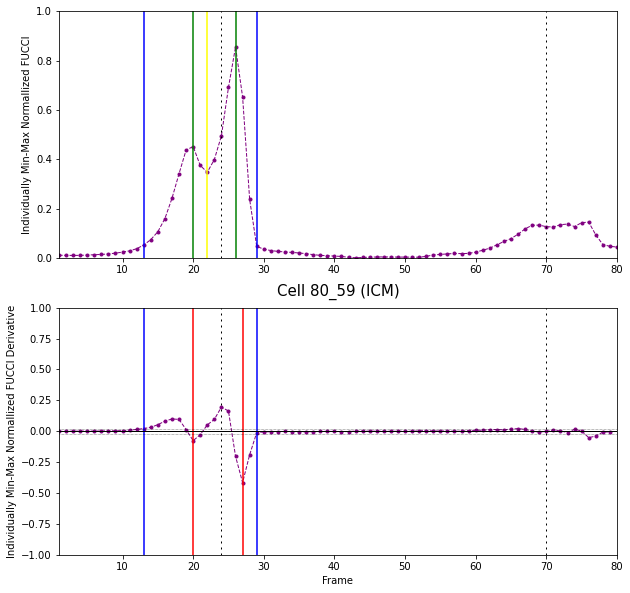

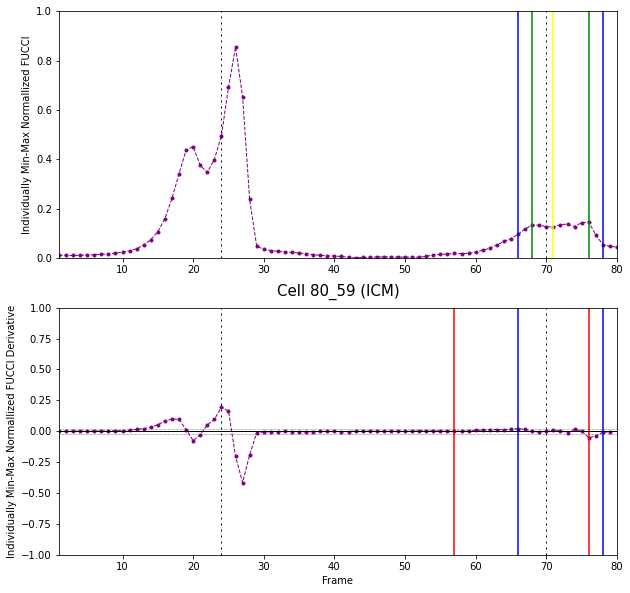

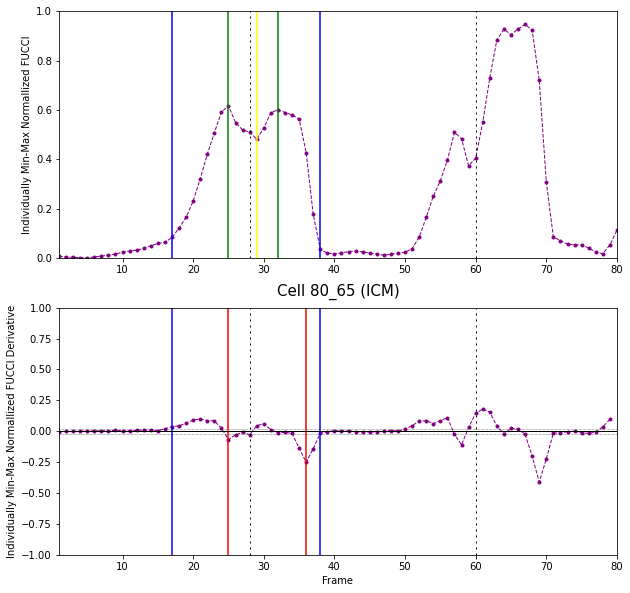

...

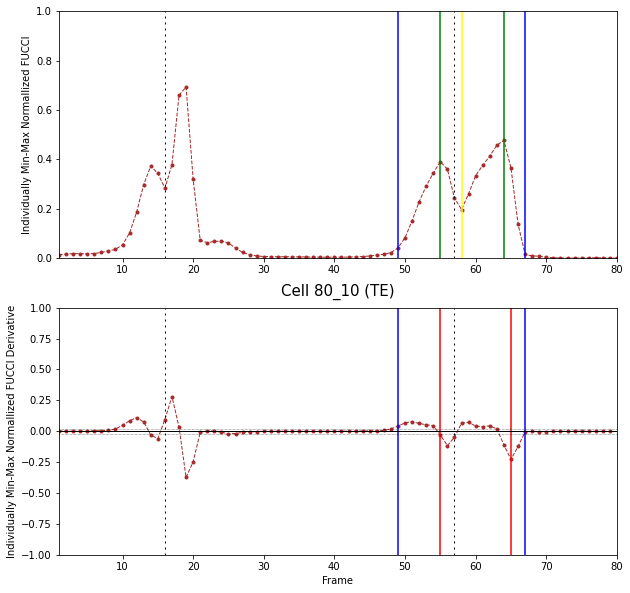

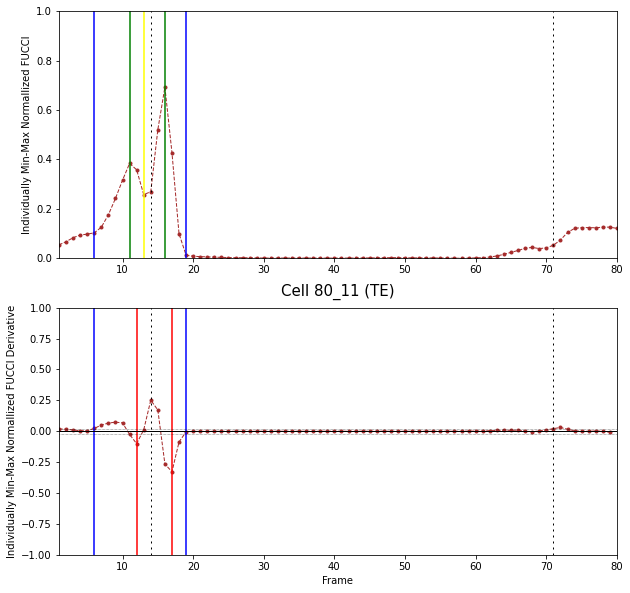

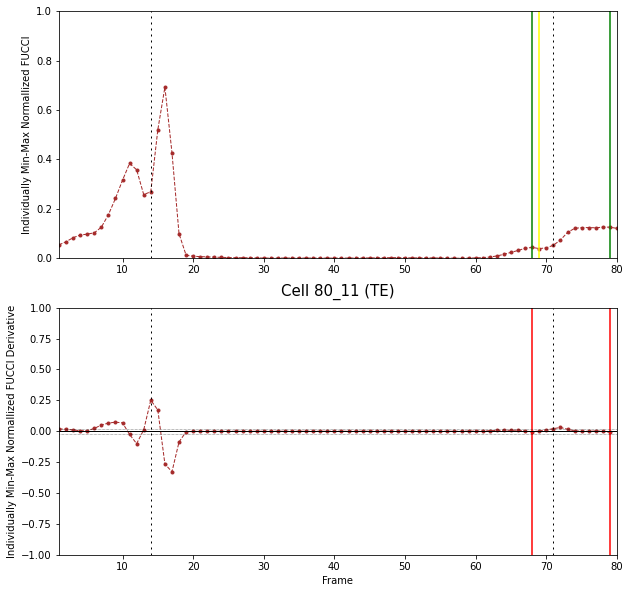

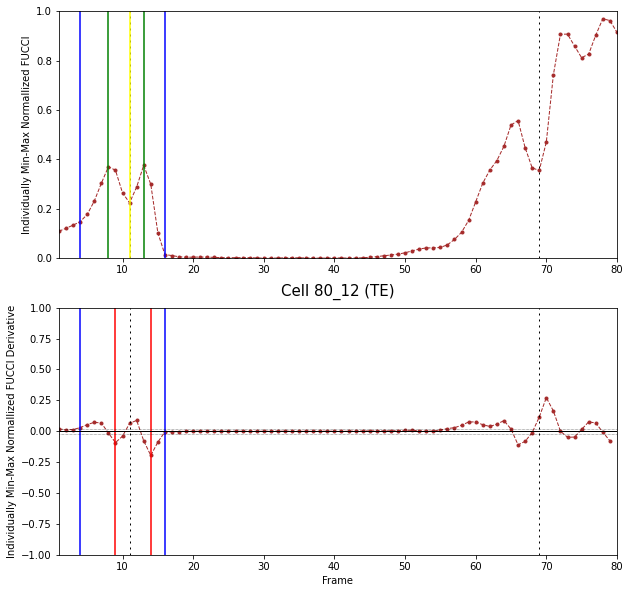

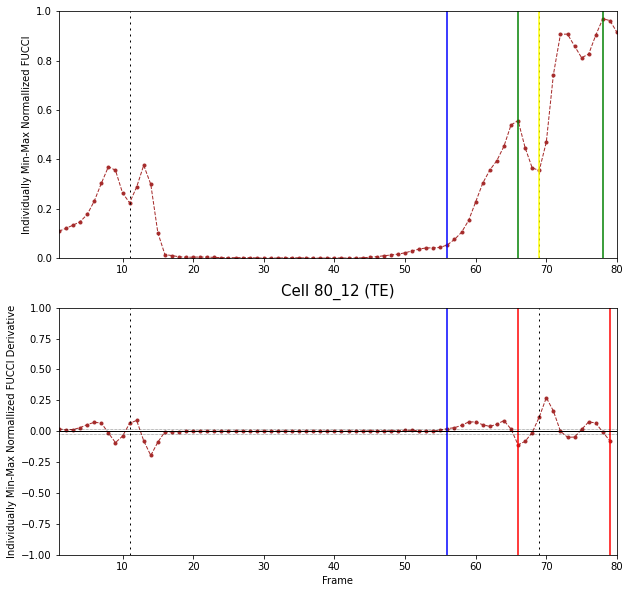

ERROR: No divisions in requested trace
ERROR: No divisions in requested trace


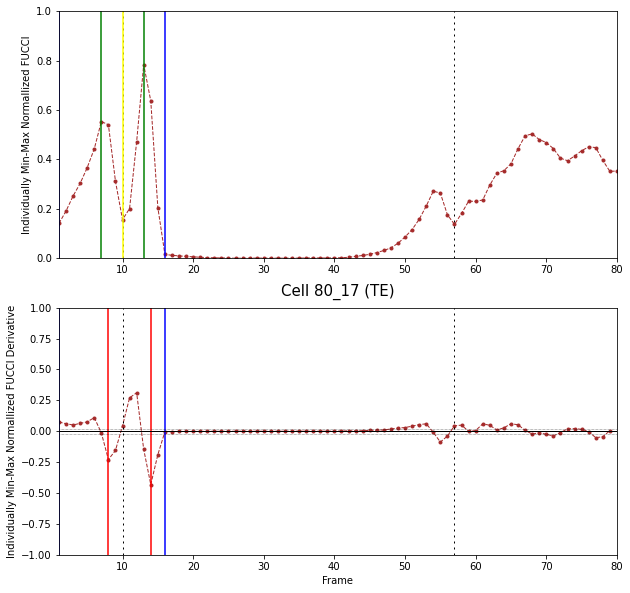

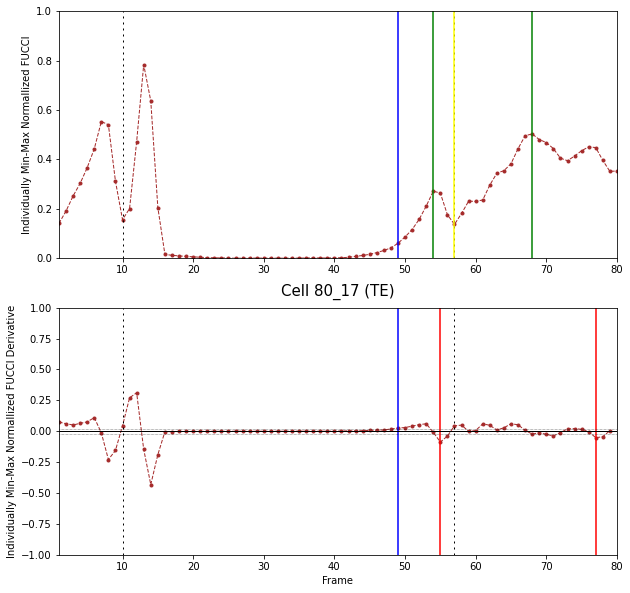

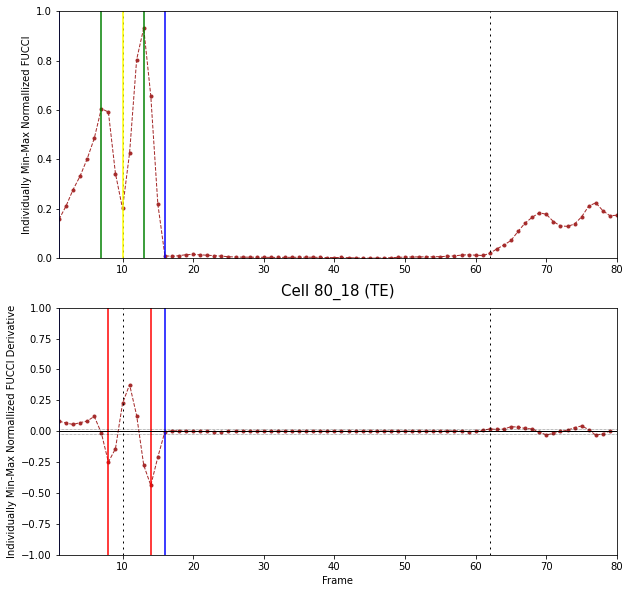

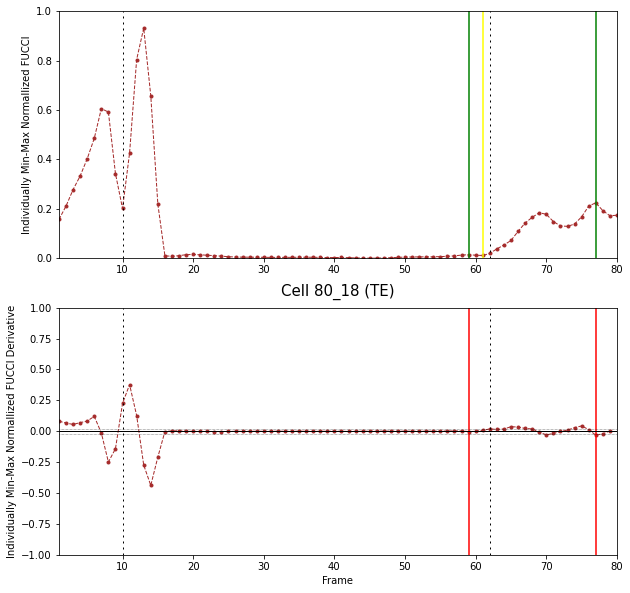

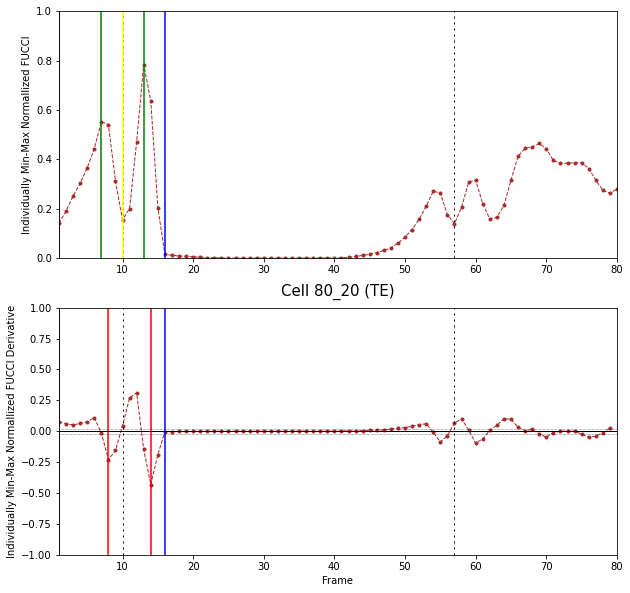

...

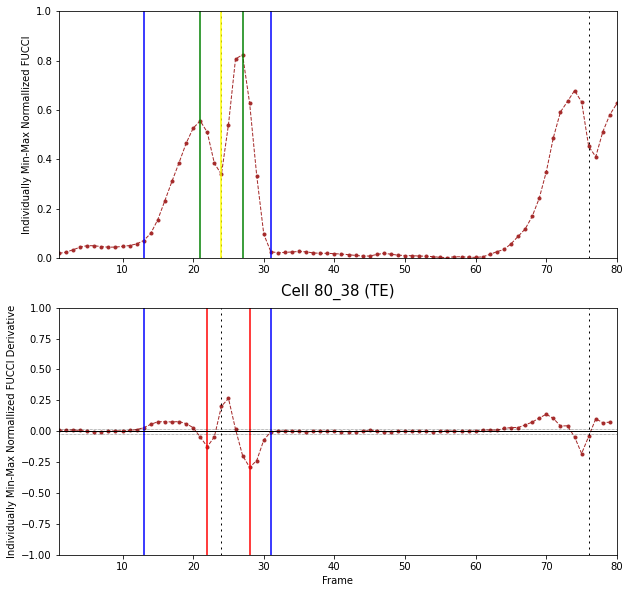

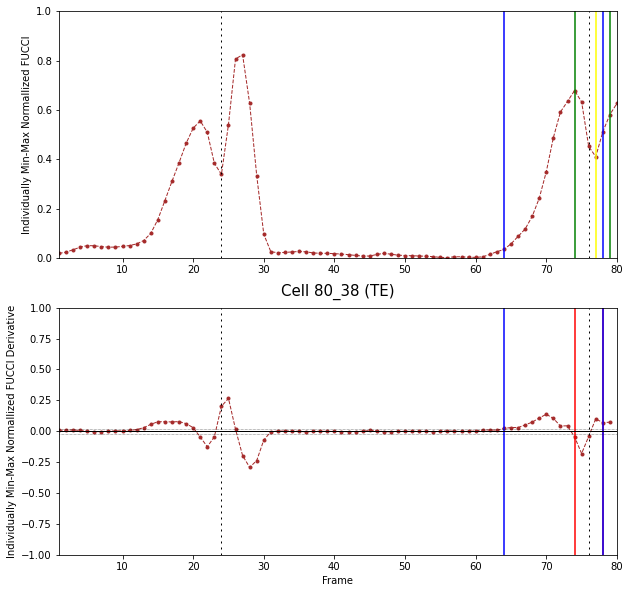

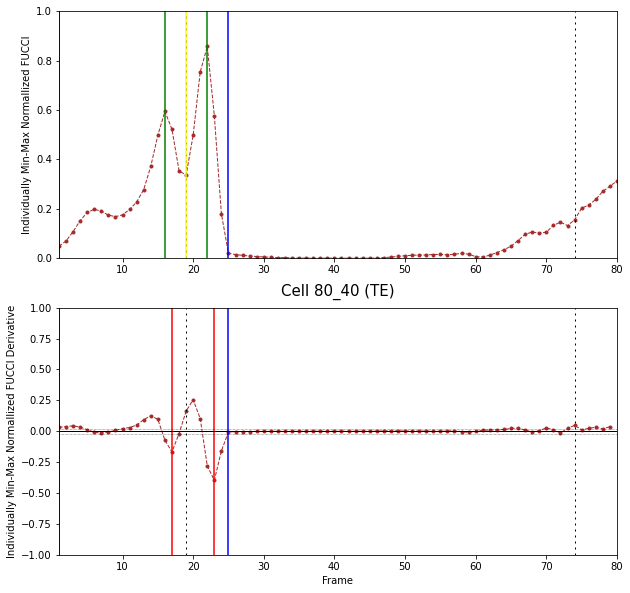

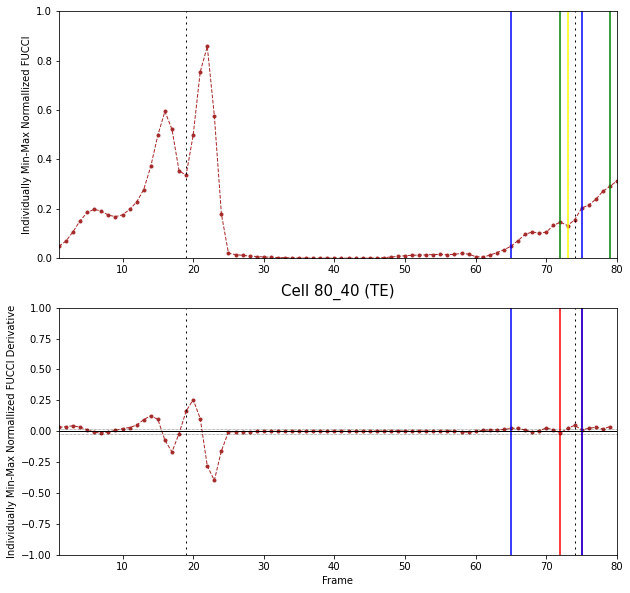

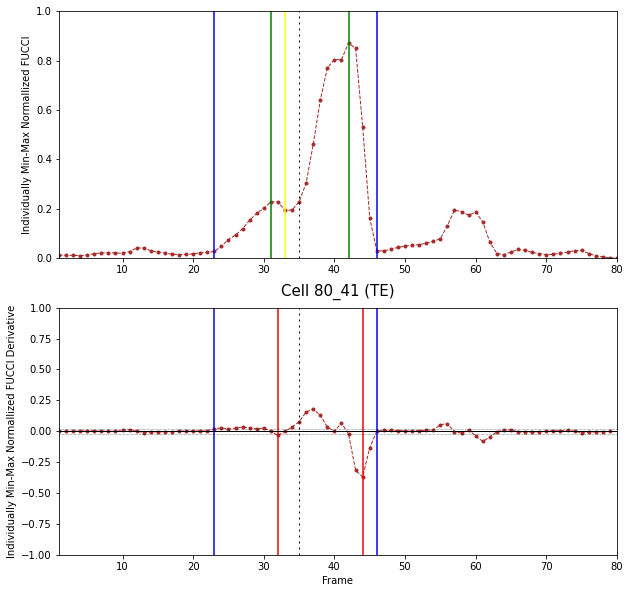

ERROR: Requested division does not occur in requested trace


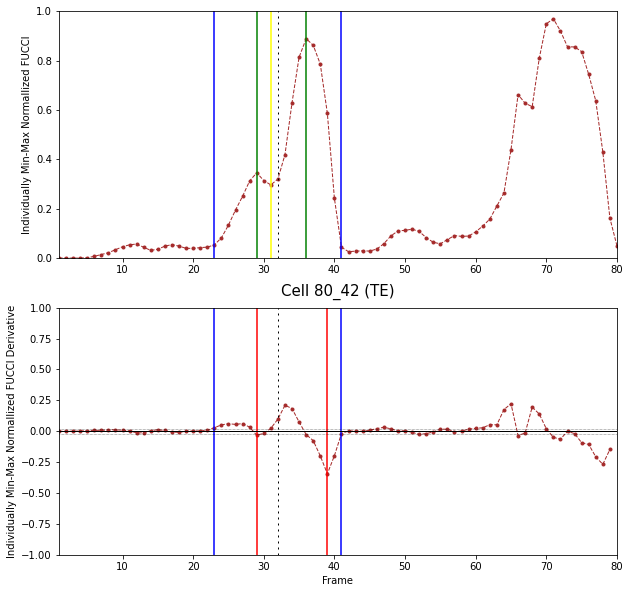

ERROR: Requested division does not occur in requested trace


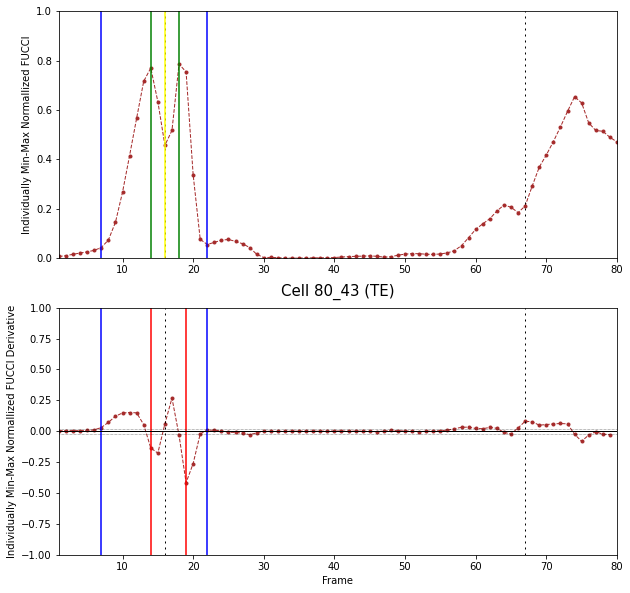

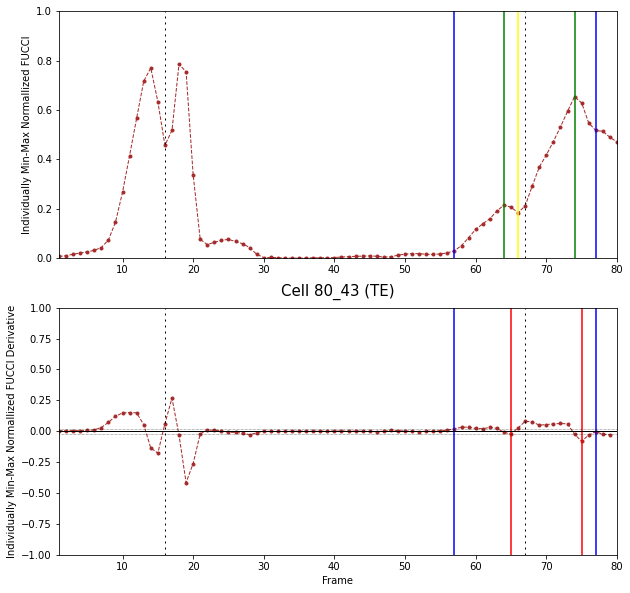

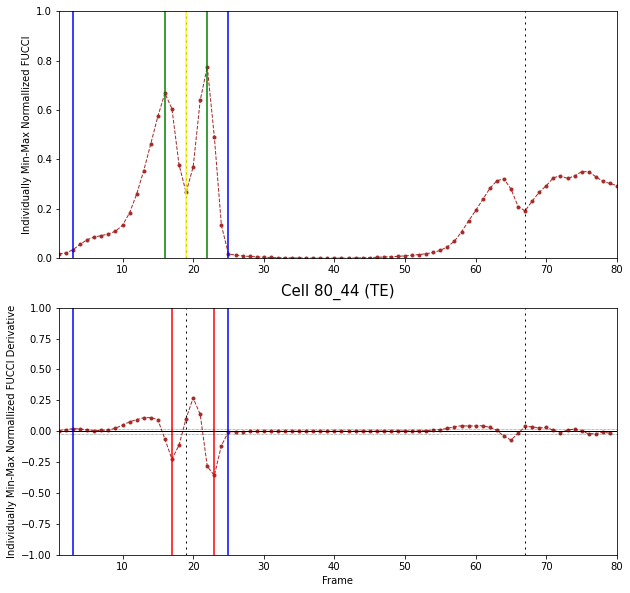

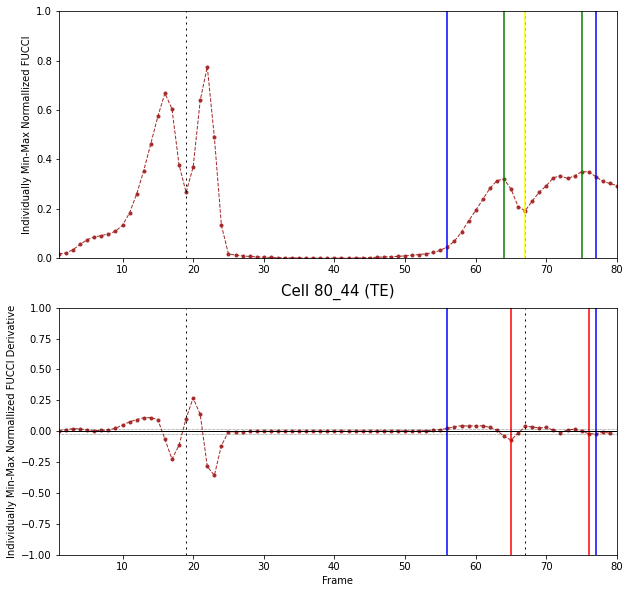

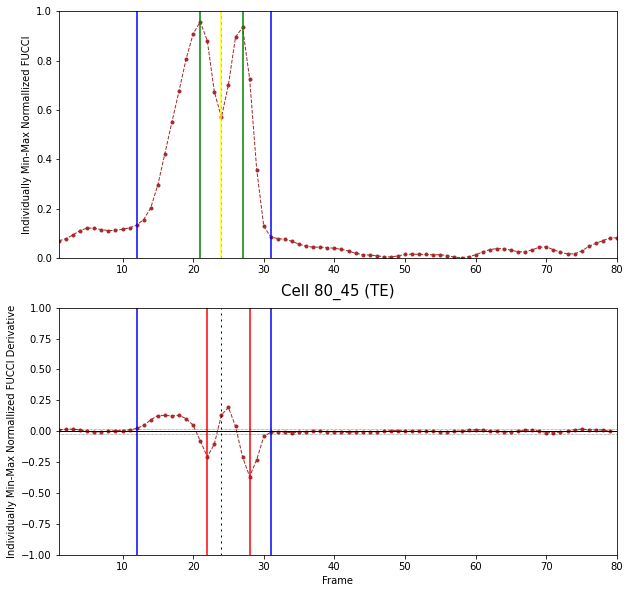

ERROR: Requested division does not occur in requested trace


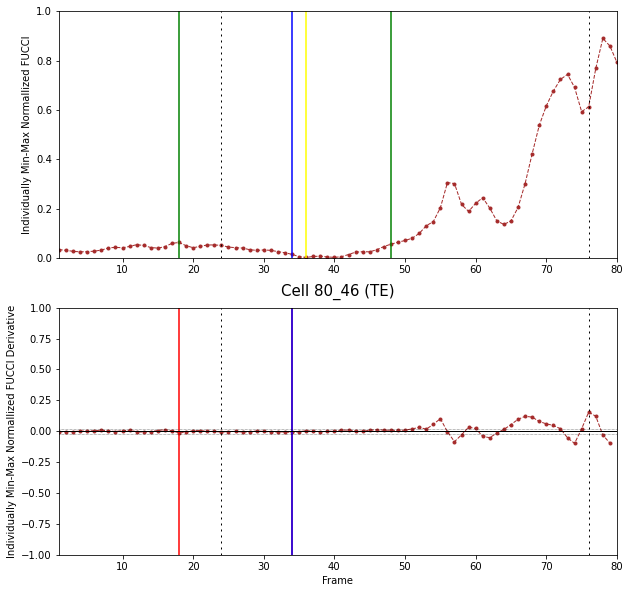

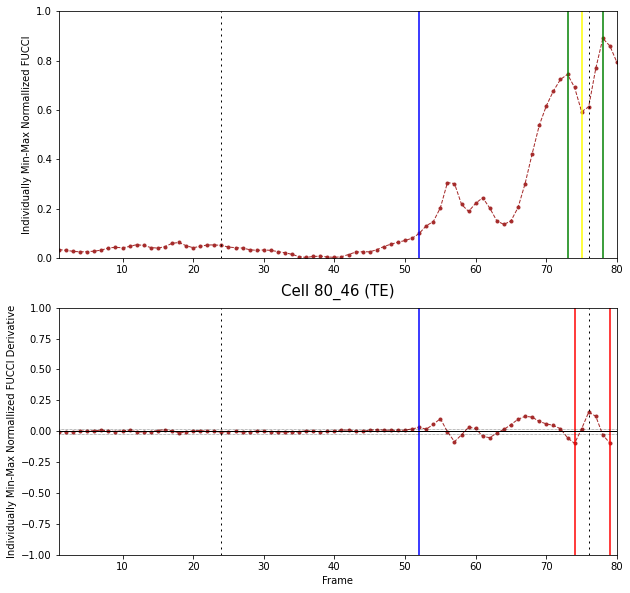

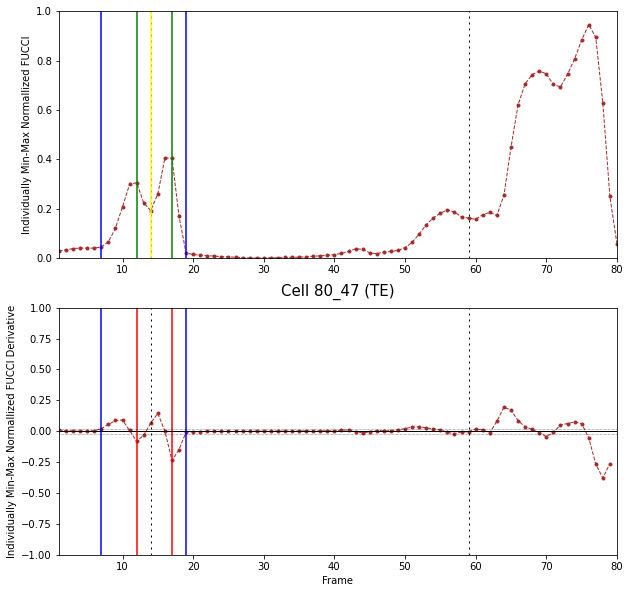

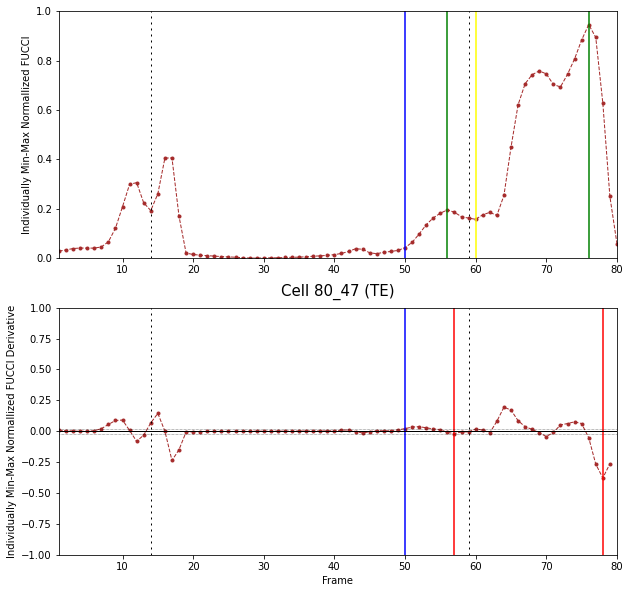

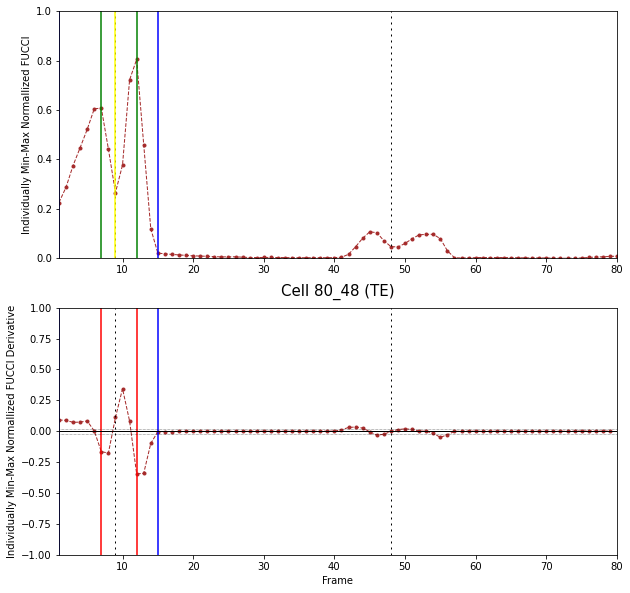

...

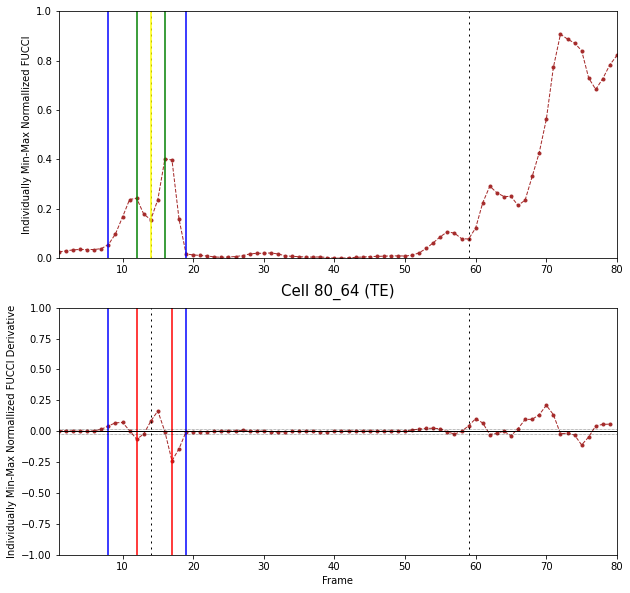

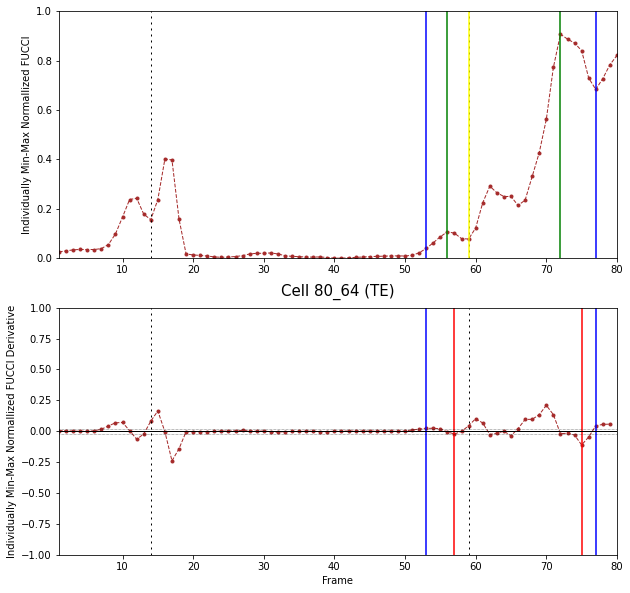

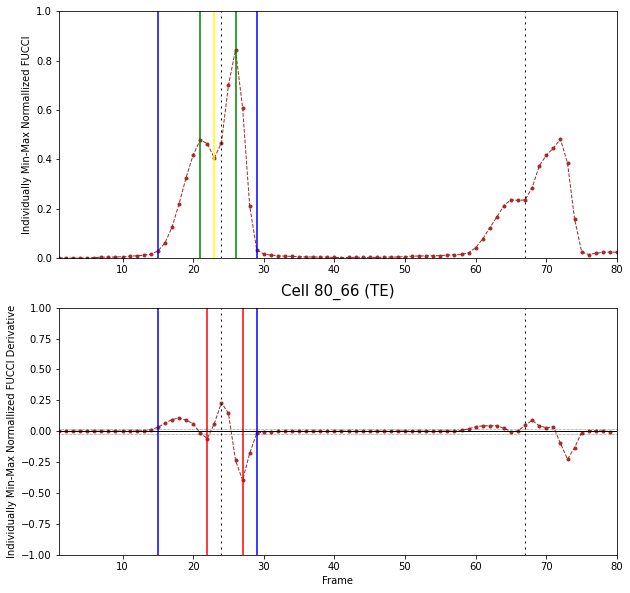

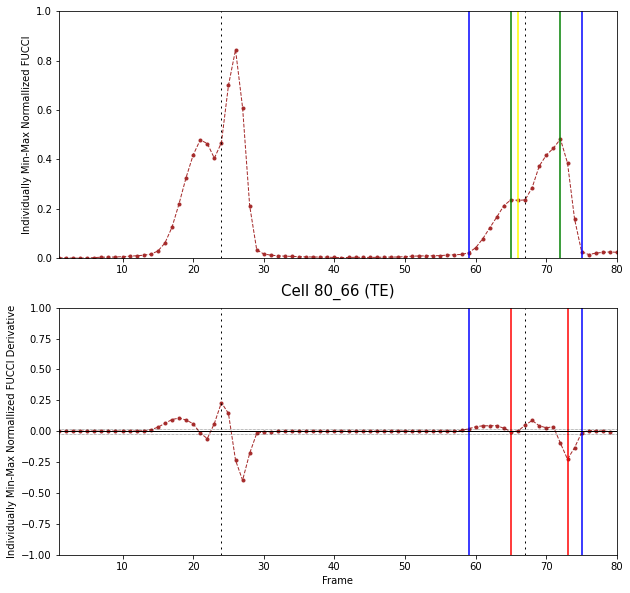

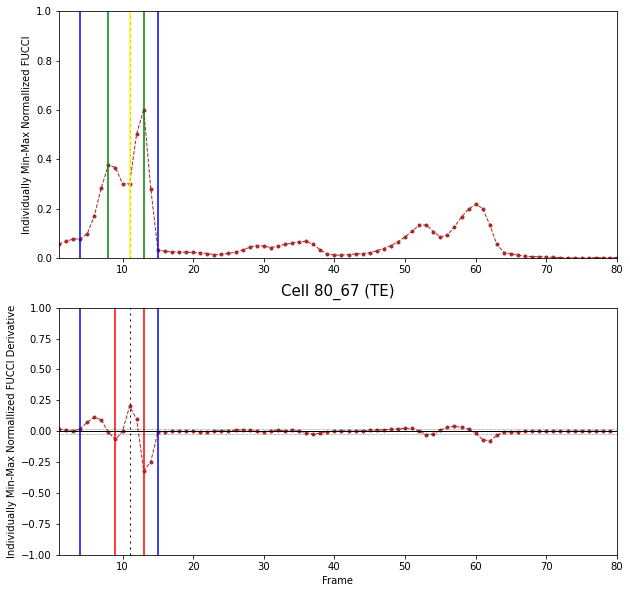

ERROR: Requested division does not occur in requested trace


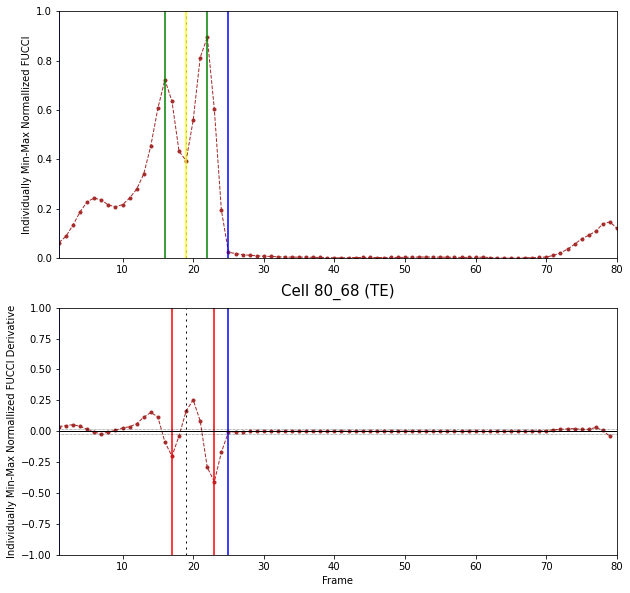

ERROR: Requested division does not occur in requested trace


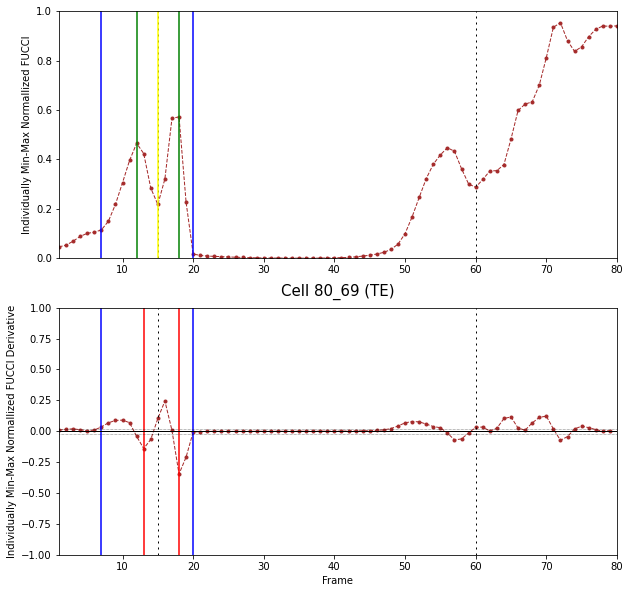

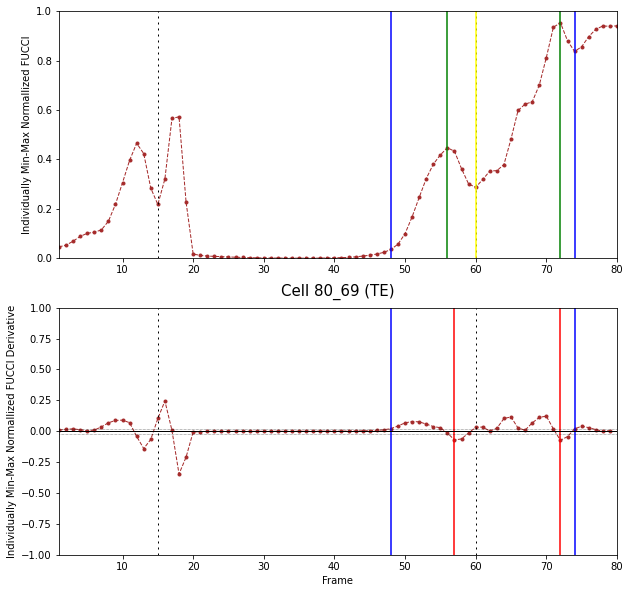

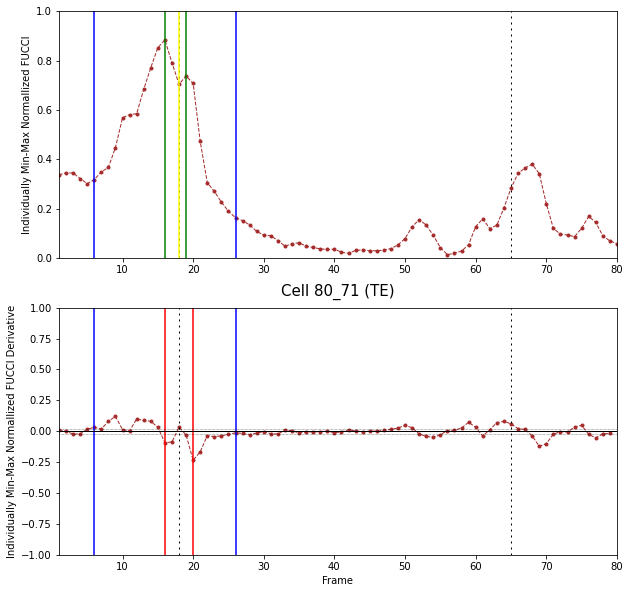

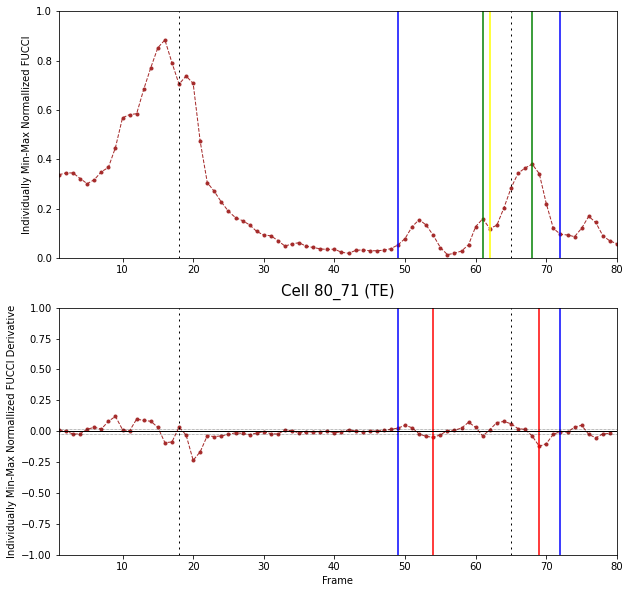

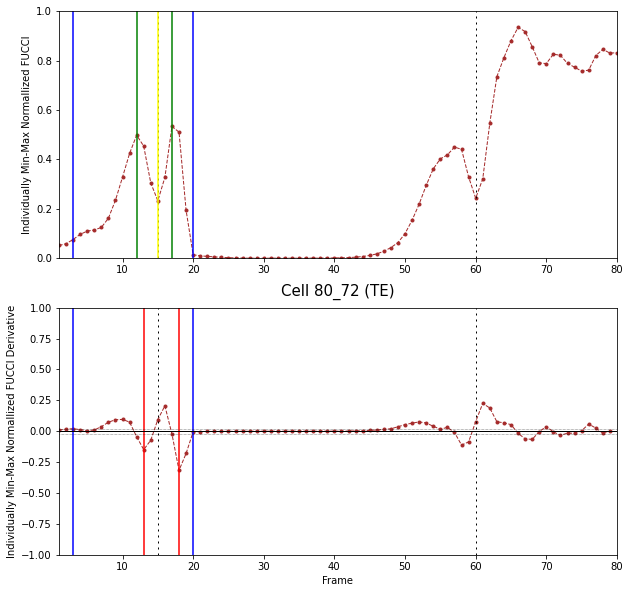

...

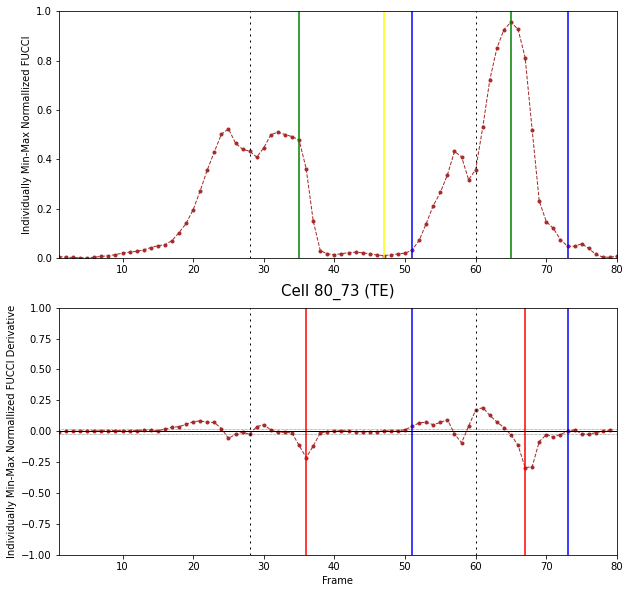

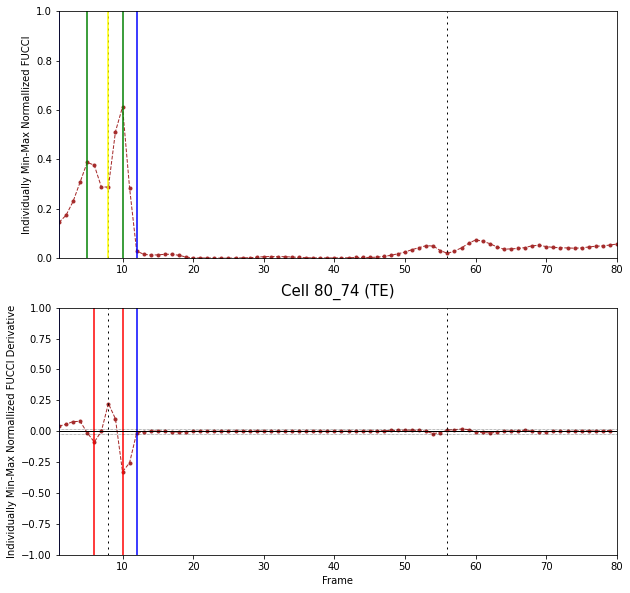

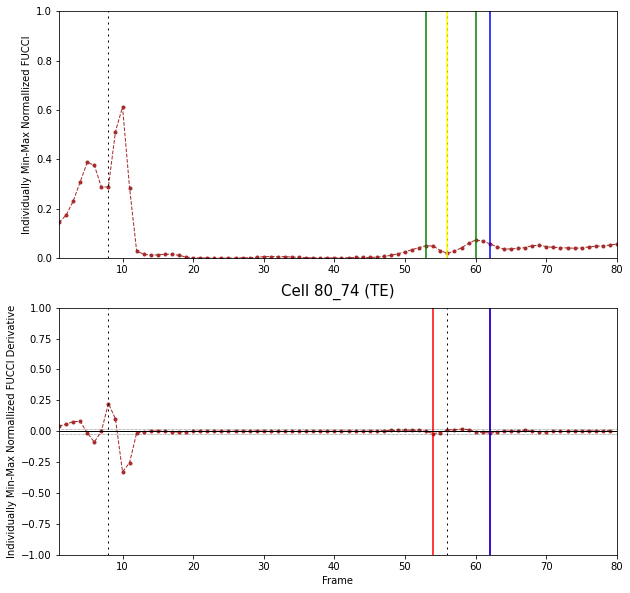

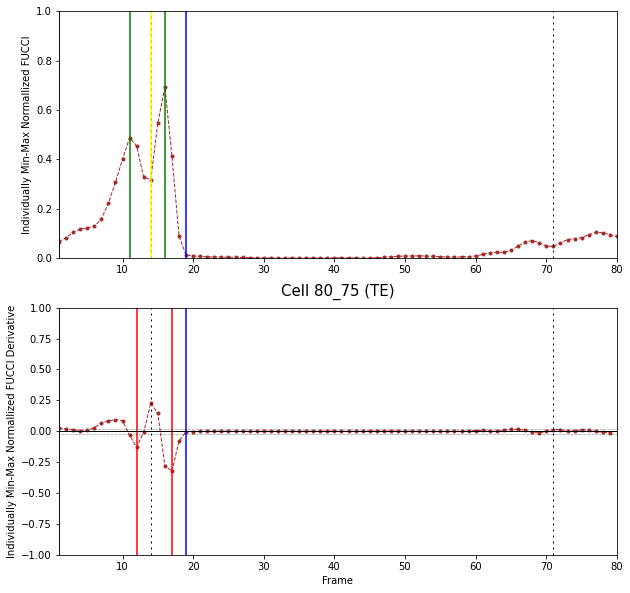

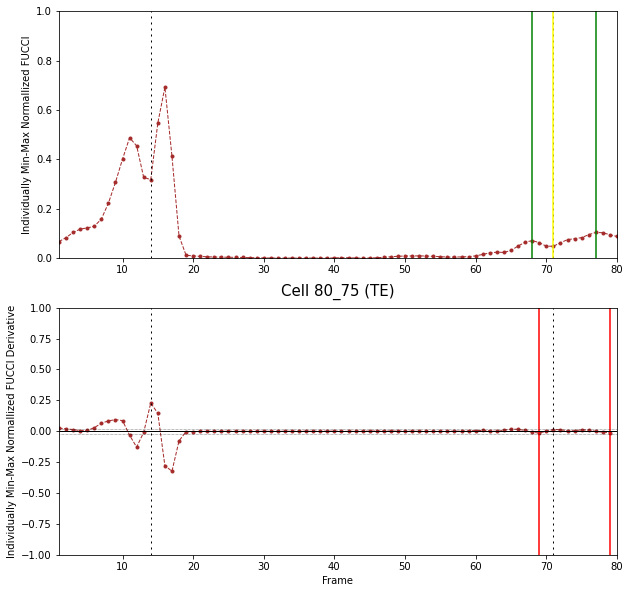

ERROR: No divisions in requested trace
ERROR: No divisions in requested trace


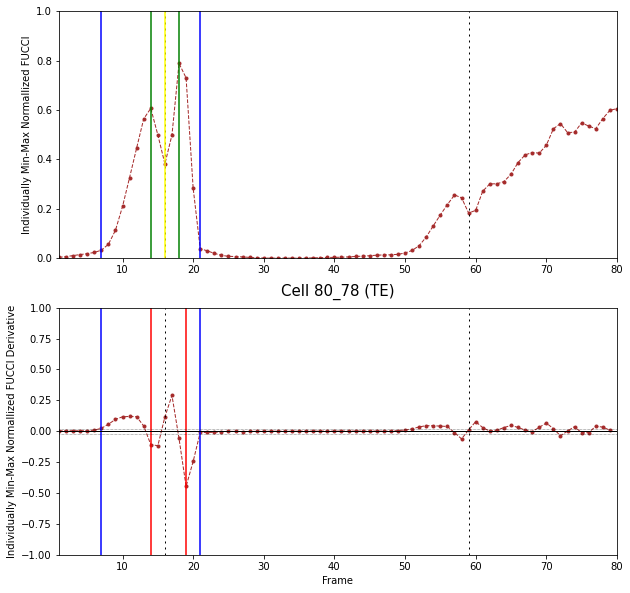

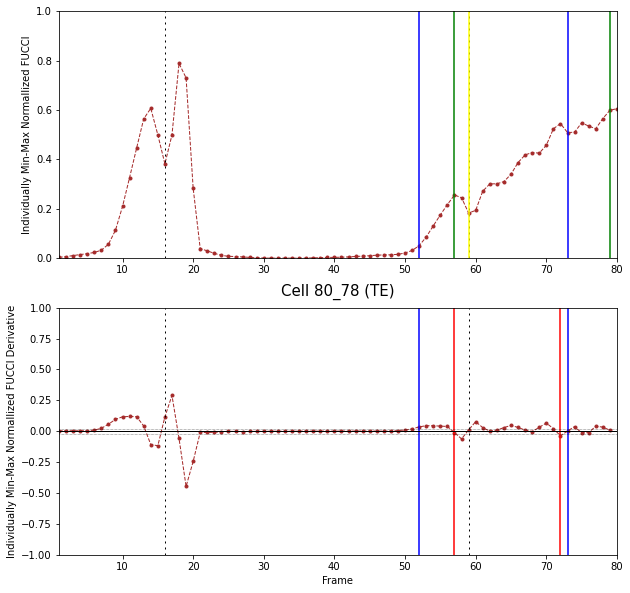

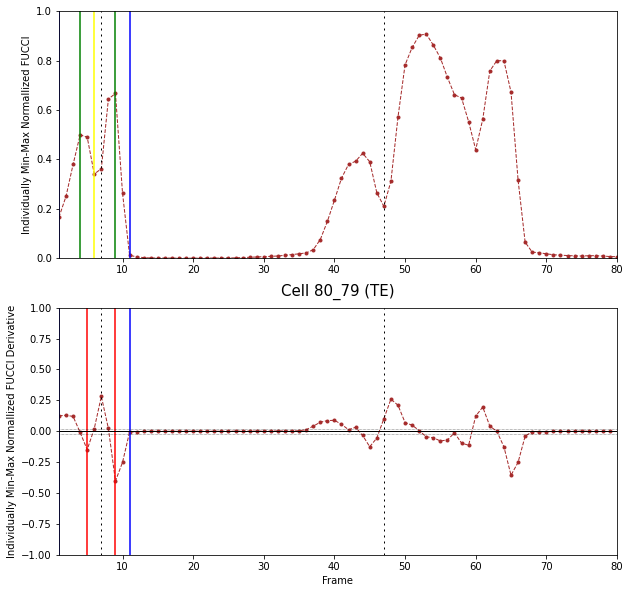

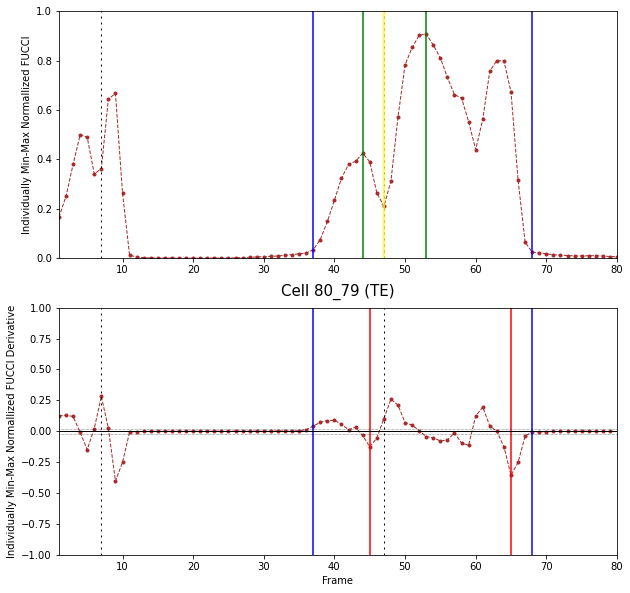

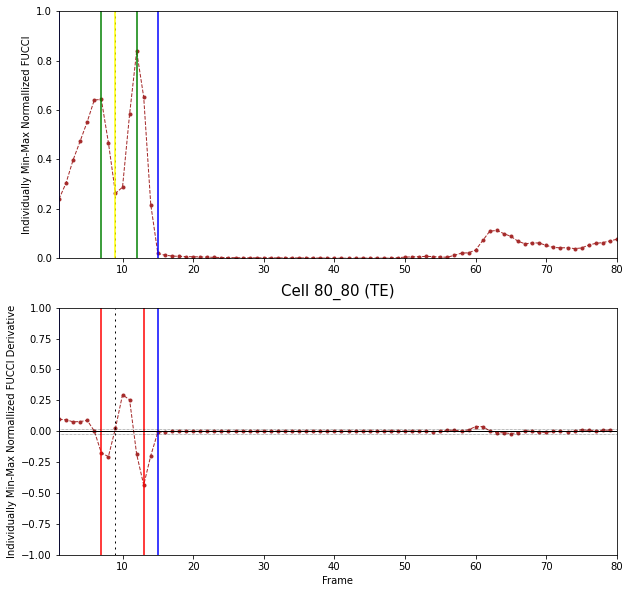

ERROR: Requested division does not occur in requested trace


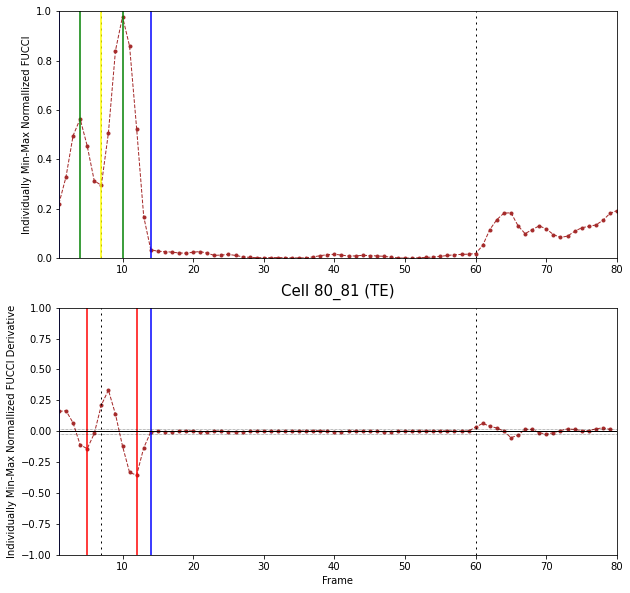

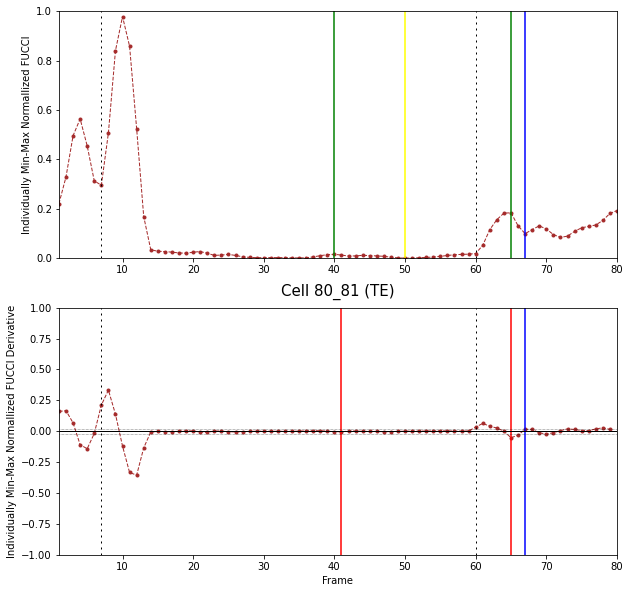

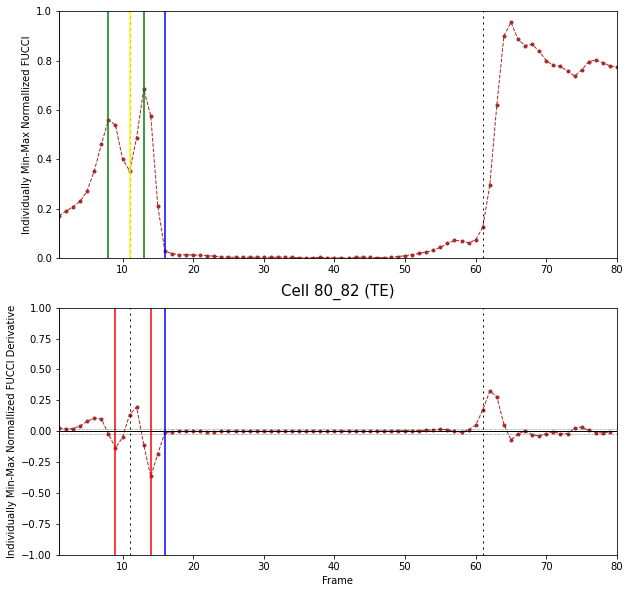

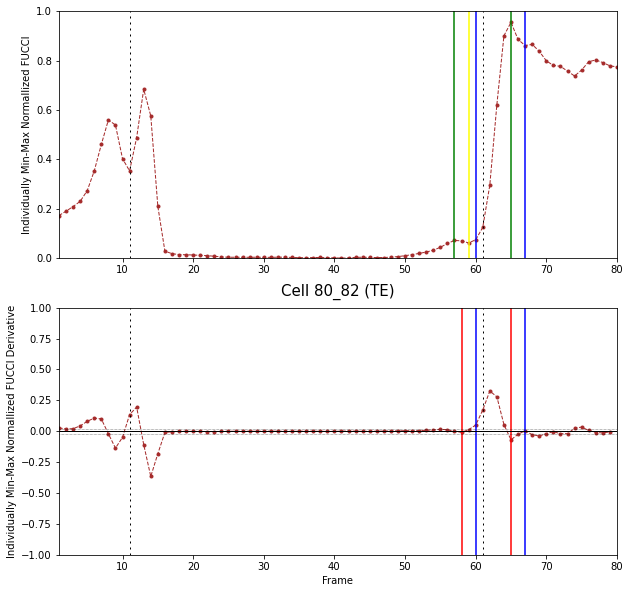

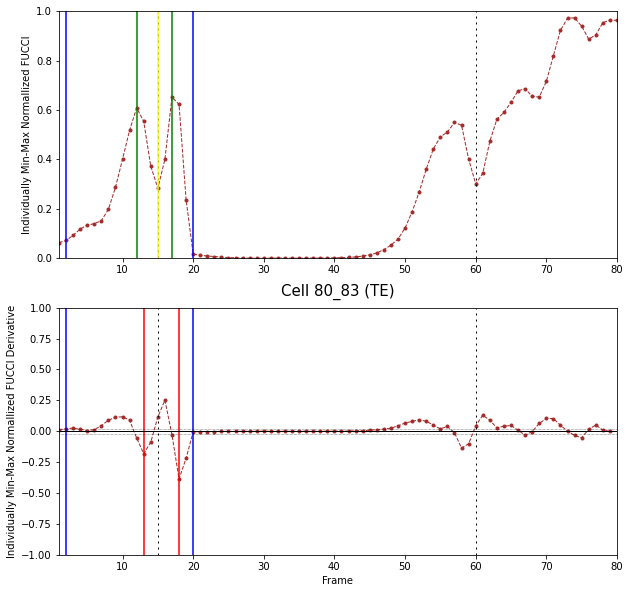

...

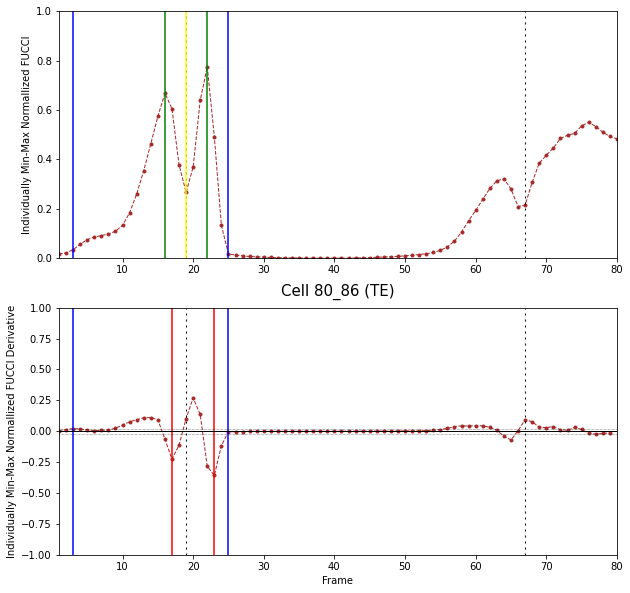

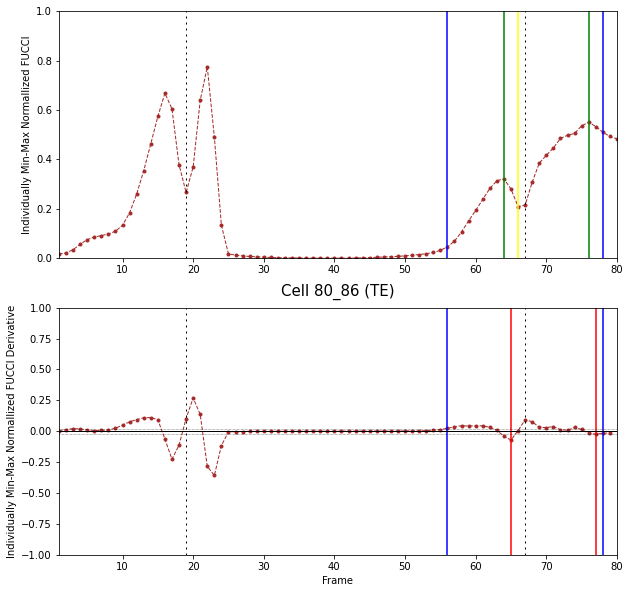

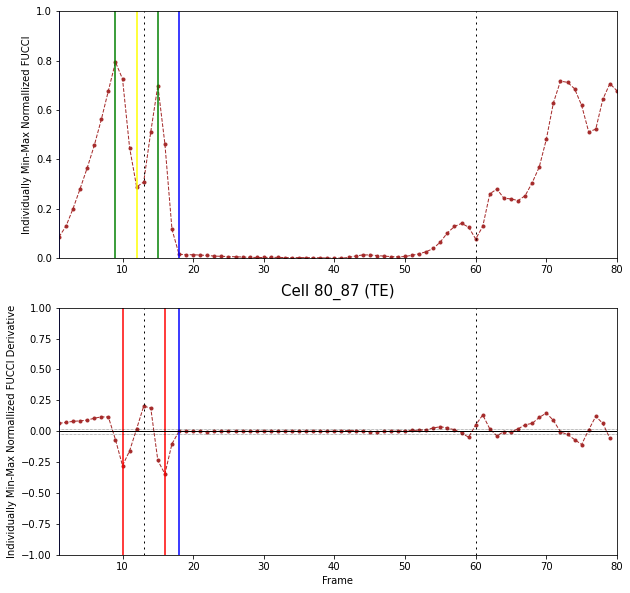

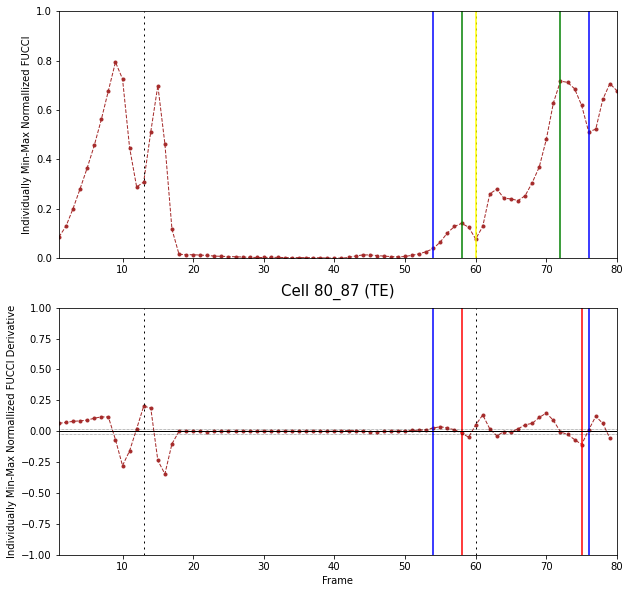

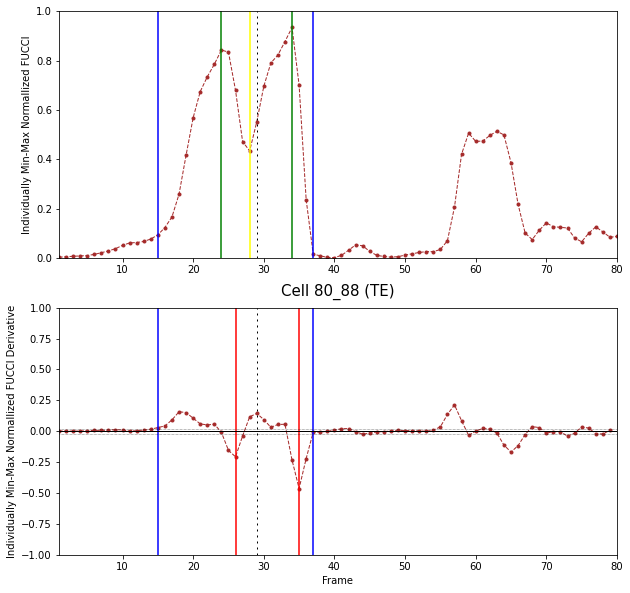

ERROR: Requested division does not occur in requested trace


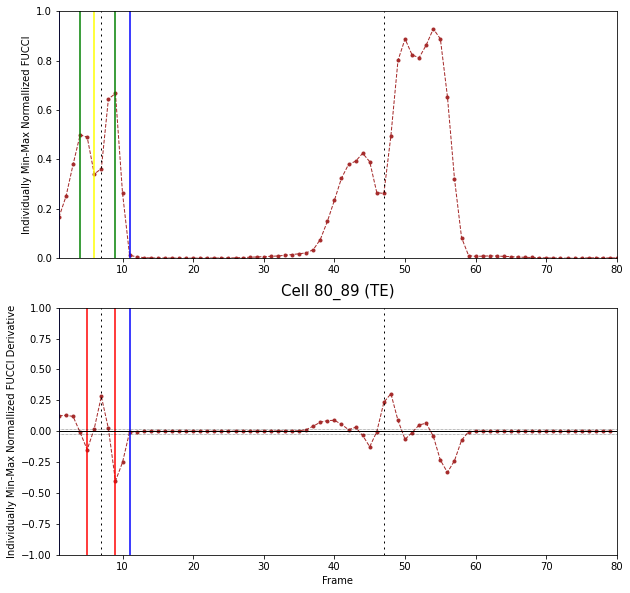

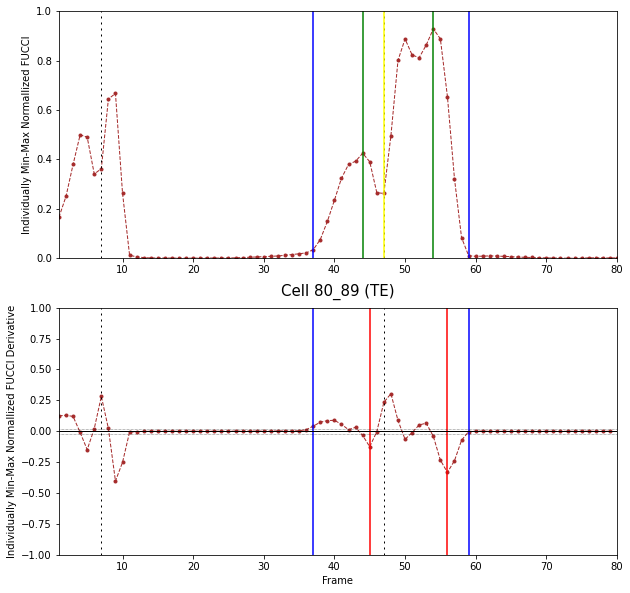

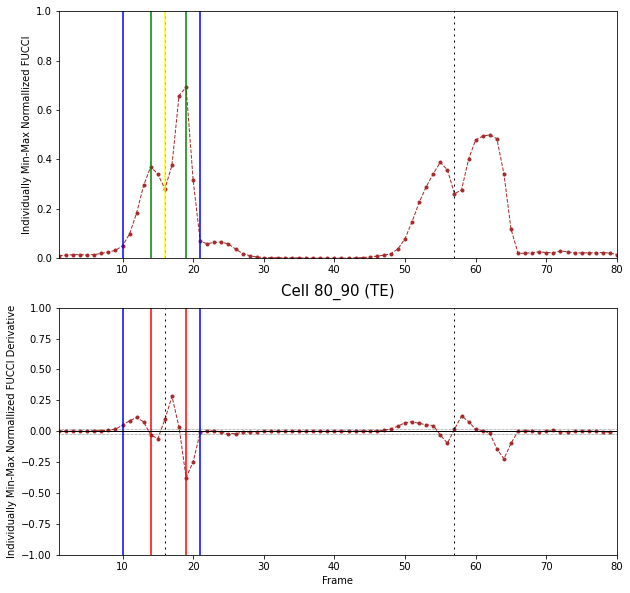

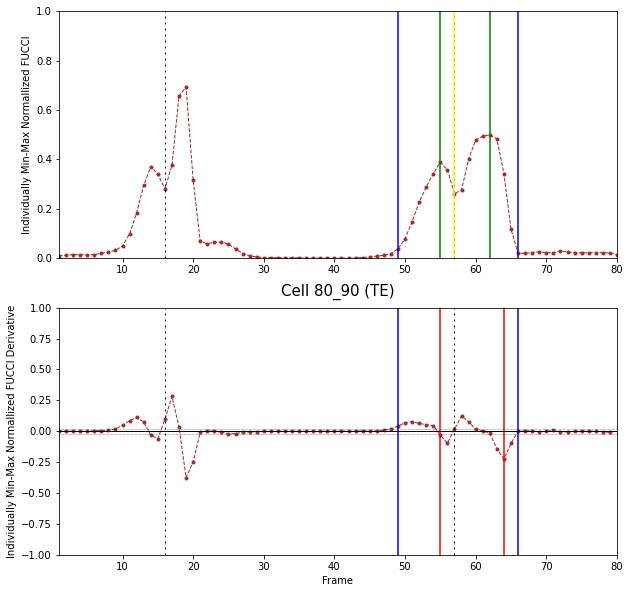

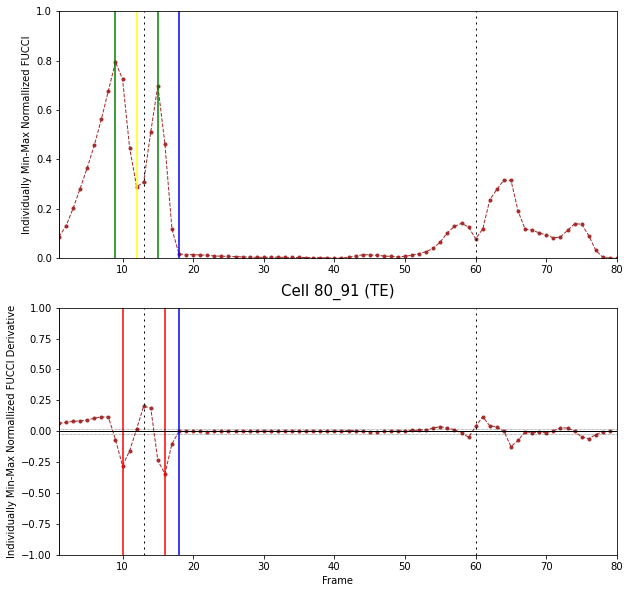

...

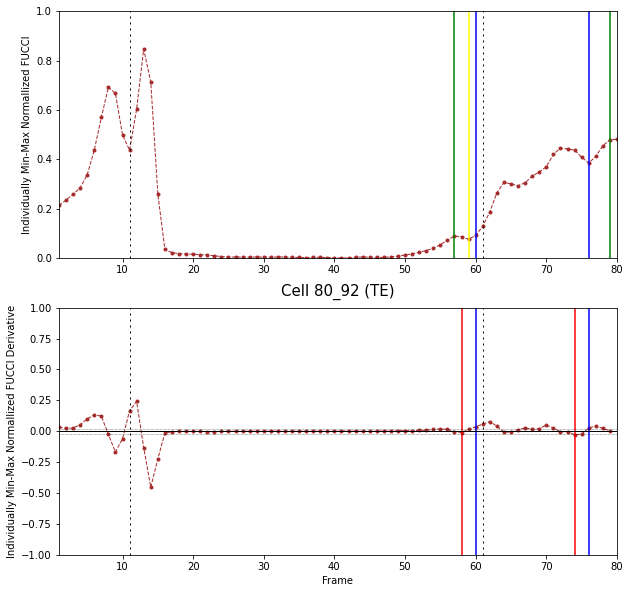

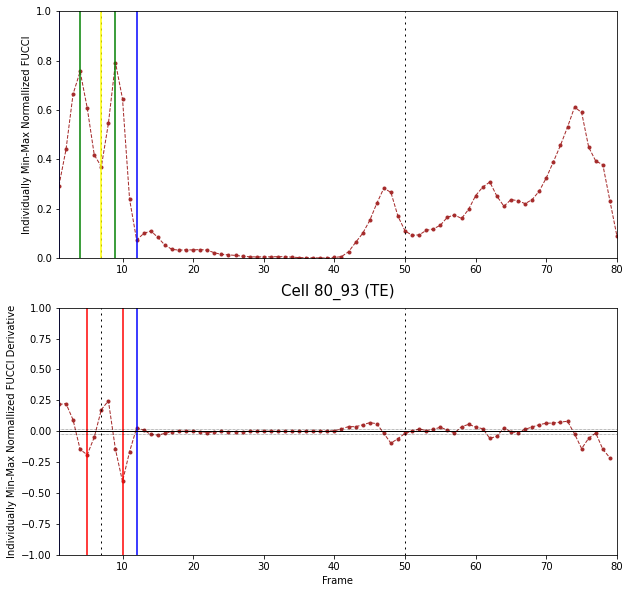

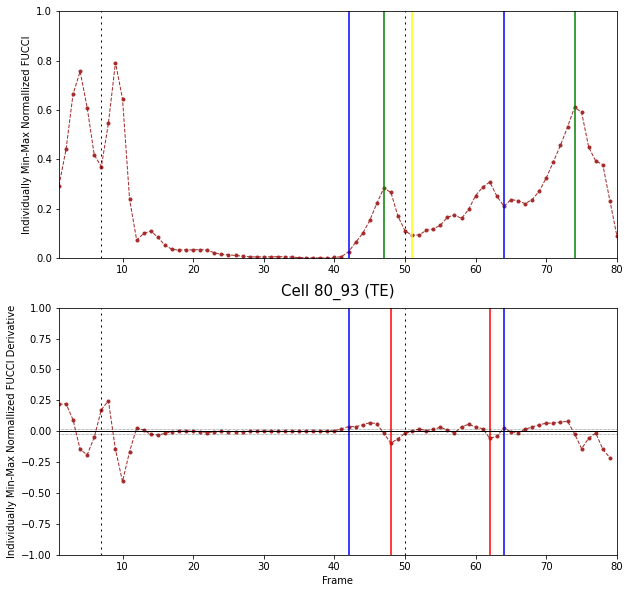

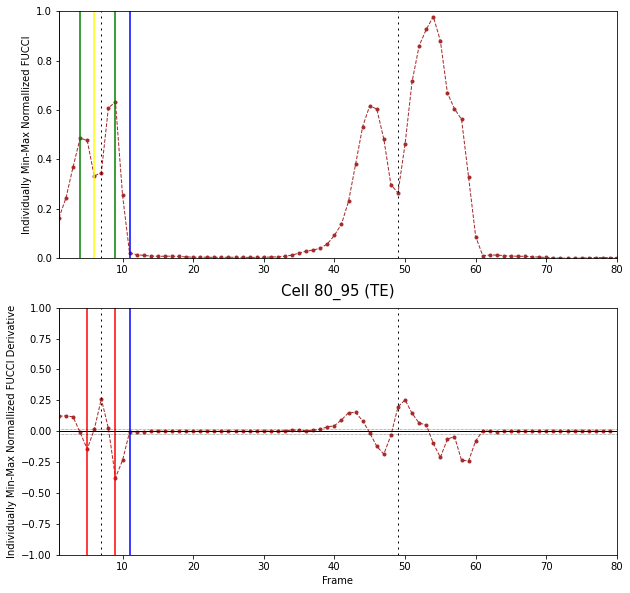

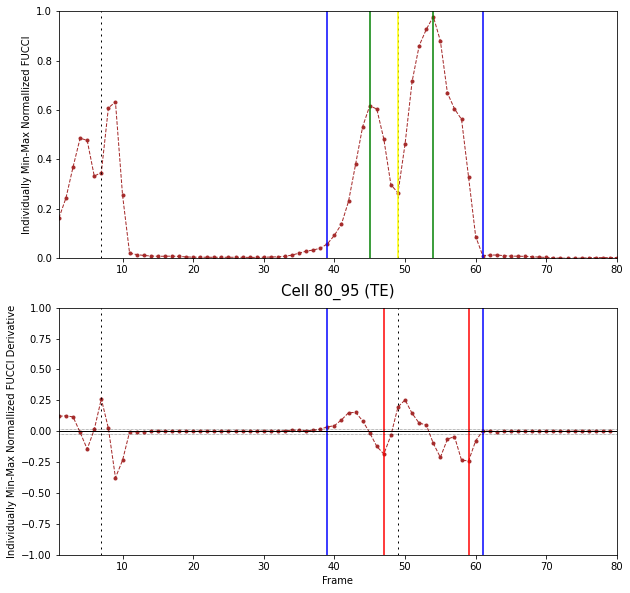

ERROR: No divisions in requested trace
ERROR: No divisions in requested trace
Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


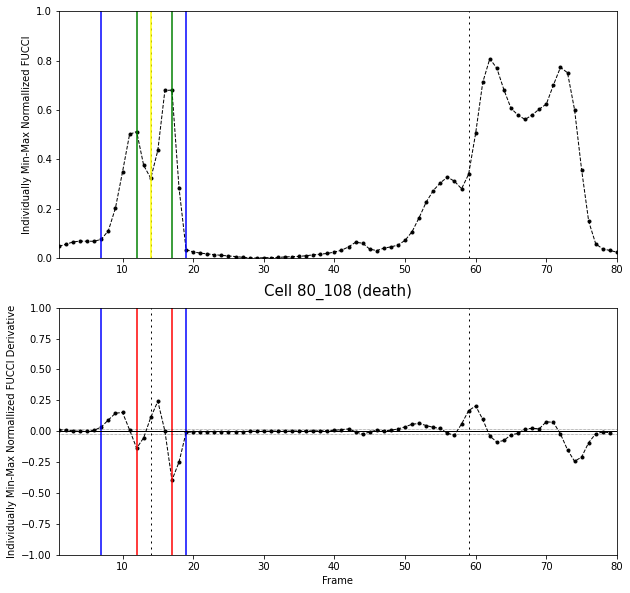

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


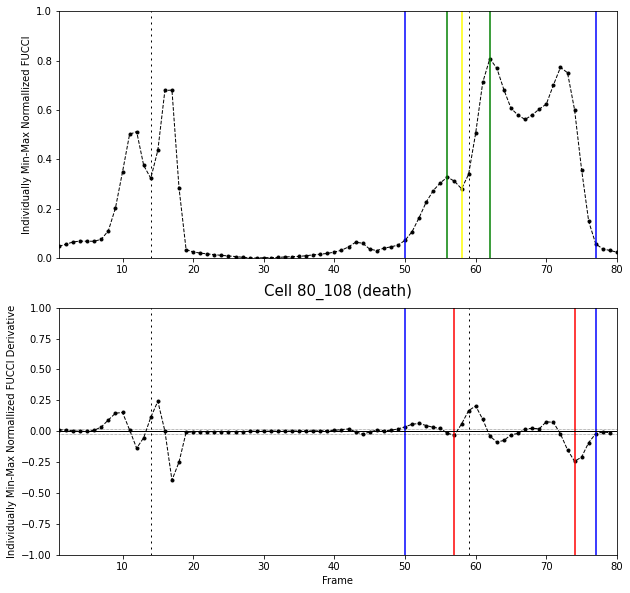

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


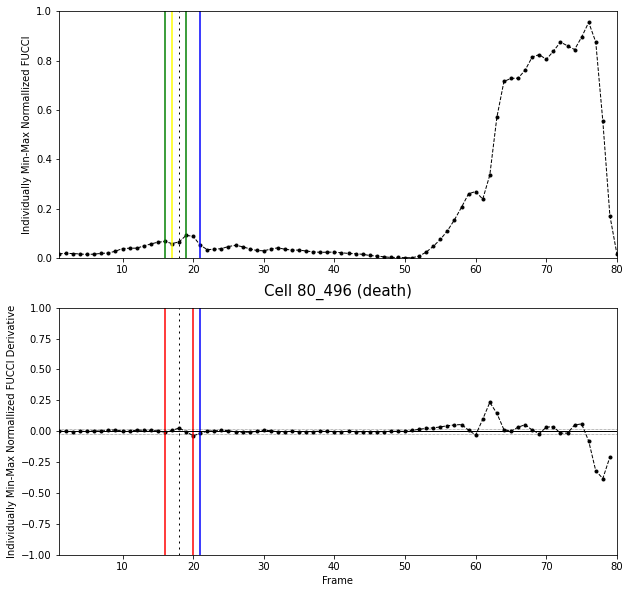

ERROR: Requested division does not occur in requested trace


In [59]:
# make plots for all cells and divisions
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 64, makeplots = True, savefig = [True, plot_path])
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 128, makeplots = True, savefig = [True, plot_path])

ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requested division
ERROR: No requ

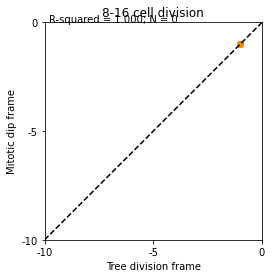

In [60]:
div_16 = []
g2_16 = []
mito_16 = []
g1_16 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 16, makeplots = False, savefig = [False, plot_path])
        div_16.append(temp_calls[0])
        g2_16.append(temp_calls[1])
        mito_16.append(temp_calls[2])
        if temp_calls[2] >= 0:
            mito_counter += 1
        g1_16.append(temp_calls[3])

min_val = min(min(div_16), min(mito_16))
max_val = max(max(div_16), max(mito_16))
min_val = (min_val // 10) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_16, mito_16, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('8-16 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_16, mito_16)) + '; N = ' + str(mito_counter), (0.98 * min_val, 0.90 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val + 5, 5))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val + 5, 5))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

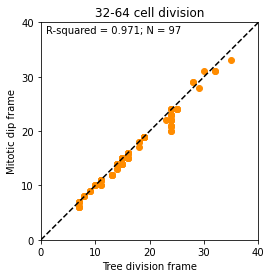

In [80]:
div_32 = []
g2_32 = []
mito_32 = []
g1_32 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 64, makeplots = False, savefig = [False, plot_path])
        div_32.append(temp_calls[0])
        g2_32.append(temp_calls[1])
        mito_32.append(temp_calls[2])
        if temp_calls[2] >= 0:
            mito_counter += 1
        g1_32.append(temp_calls[3])

min_val = min(min(div_32), min(mito_32))
max_val = max(max(div_32), max(mito_32))
min_val = (min_val // 10) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_32, mito_32, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('32-64 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_32, mito_32)) + '; N = ' + str(mito_counter), (1.05 * min_val + 1, 0.95 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val+10, 10))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val+10, 10))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace
ERROR: Requested division does not occur in requested trace


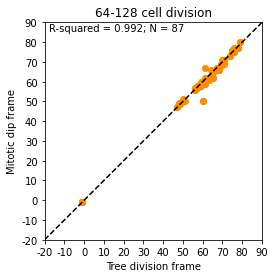

In [76]:
div_64 = []
g2_64 = []
mito_64 = []
g1_64 = []
mito_counter = 0
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        temp_calls = annotate_division(indiv_norm_traces, indiv_norm_derivs, cell[0], division_round = 128, makeplots = False, savefig = [False, plot_path])
        div_64.append(temp_calls[0])
        g2_64.append(temp_calls[1])
        mito_64.append(temp_calls[2])
        if temp_calls[2] > 0:
            mito_counter += 1
        g1_64.append(temp_calls[3])

min_val = min(min(div_64), min(mito_64))
max_val = max(max(div_64), max(mito_64))
min_val = (min_val // 10 - 1) * 10
max_val = (max_val // 10 + 1) * 10

plt.scatter(div_64, mito_64, color='darkorange')
plt.xlabel('Tree division frame')
plt.ylabel('Mitotic dip frame')
plt.title('64-128 cell division')
plt.annotate("R-squared = {:.3f}".format(r2_score(div_64, mito_64)) + '; N = ' + str(mito_counter), (0.9 * min_val, 0.95 * max_val))
plt.axline((0, 0), slope=1, color = 'k', linestyle='--')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

plt.gca().yaxis.set_ticks(np.arange(min_val, max_val + 10, 10))
plt.gca().xaxis.set_ticks(np.arange(min_val, max_val + 10, 10))
plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.gca().set_aspect('equal')

In [60]:
def annotate_trace(raw_traces, deriv_traces, cell_ID, smoothing = ['inverse', 1], makeplots = False, savefig = [False, 'null']):
    # find and format data of the queried cell
    fate_index = -1
    cell_index = -1
    cell_name = str(cell_ID[0]) + '_' + str(cell_ID[1])
    
    cnt = 0
    for fates in raw_traces:
        if cell_name in fates[1][1]:
            fate_index = cnt
            cell_index = fates[1][1].index(cell_name)
        cnt += 1
    
    temp_frames = raw_traces[fate_index][1][0][cell_index][0]
    temp_smooth = smoothen_trace(raw_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_derivs = smoothen_trace(deriv_traces[fate_index][1][0][cell_index][1], method = smoothing[0], kernel_size = smoothing[1])
    temp_divs = raw_traces[fate_index][1][2][cell_index]
    
    # annotate trace features
    pre_threshs = []
    mitotic_dips = []
    post_threshs = []
    
    for a_div in temp_divs:
        div_frame = a_div[0]
        div_frame_index = temp_frames.index(div_frame)

        permit = 25
        pre_div_peak = [-1, -999]
        pre_div_dip = [-1, 999]
        for i in range(max(div_frame_index - permit, 0), div_frame_index - 1, 1):
            if temp_smooth[i] > pre_div_peak[1]:
                pre_div_peak[0] = i
                pre_div_peak[1] = temp_smooth[i]
            if temp_derivs[i] < pre_div_dip[1]:
                pre_div_dip[0] = i
                pre_div_dip[1] = temp_derivs[i]

        post_div_peak = [-1, -999]
        post_div_dip = [-1, 999]
        for i in range(div_frame_index + 1, min(div_frame_index + permit, len(temp_frames) - 1), 1):
            if temp_smooth[i] > post_div_peak[1]:
                post_div_peak[0] = i
                post_div_peak[1] = temp_smooth[i]
            if temp_derivs[i] < post_div_dip[1]:
                post_div_dip[0] = i
                post_div_dip[1] = temp_derivs[i]

        mitotic_dip = [-1, 999]
        for i in range(pre_div_peak[0], post_div_peak[0], 1):
            if temp_smooth[i] < mitotic_dip[1]:
                mitotic_dip[0] = i
                mitotic_dip[1] = temp_smooth[i]

        pre_div_thresh = [-1, False]
        i = max(div_frame_index - permit, 0)
        while not pre_div_thresh[1] and i < div_frame_index:
            if temp_derivs[i] >= deriv_thresh:
                pre_div_thresh[1] = True
                pre_div_thresh[0] = i
            i += 1

        post_div_thresh = [-1, False]
        i =  post_div_dip[0]
        while not post_div_thresh[1] and i < min(div_frame_index + permit, len(temp_derivs) - 1):
            if temp_derivs[i] >= -1 * deriv_thresh:
                post_div_thresh[1] = True
                post_div_thresh[0] = i
            i += 1
        
        pre_threshs.append(pre_div_thresh)
        mitotic_dips.append(mitotic_dip)
        post_threshs.append(post_div_thresh)
    
    # format annotations
    
    out_pre_threshs = []
    for obj in pre_threshs:
        if obj[1]:
            out_pre_threshs.append(temp_frames[obj[0]])
    out_mitotic_dips = []
    for obj in mitotic_dips:
        if obj[0] >= 0:
            out_mitotic_dips.append(temp_frames[obj[0]])
    out_post_threshs = []
    for obj in post_threshs:
        if obj[1]:
            out_post_threshs.append(temp_frames[obj[0]])
    
    # make annotated plots
    if makeplots:
        plt.figure(figsize=(10, 10))

        plt.subplot(2, 1, 1)
        plt.plot(temp_frames, temp_smooth, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        for obj in out_pre_threshs:
            plt.axvline(x = obj, c = 'k')
        for obj in out_mitotic_dips:
            plt.axvline(x = obj, c = 'k')
        for obj in out_post_threshs:
            plt.axvline(x = obj, c = 'k')

        plt.ylim(0, 1)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI')

        plt.subplot(2, 1, 2)
        plt.plot(deriv_traces[fate_index][1][0][cell_index][0], temp_derivs, c = colsel_by_fate(fate[fate_index]), marker='o', markersize=3, linestyle ='--', linewidth = 1)

        # draw tree-based division lines
        for division in temp_divs:
            plt.axvline(x = division[0], color = division_line_style[0], linestyle = division_line_style[1], linewidth = division_line_style[2])
        # draw annotated events
        for obj in out_pre_threshs:
            plt.axvline(x = obj, c = 'k')
        for obj in out_post_threshs:
            plt.axvline(x = obj, c = 'k')

        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.axhline(y = deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = -1 * deriv_thresh, color = 'k', linewidth = 0.5, linestyle = ':')
        plt.axhline(y = 0, color = 'k', linewidth = 1)
        plt.ylim(-0.5, 0.5)
        plt.xlim(stack[2][1][0], stack[2][1][1])
        plt.ylabel('Individually Min-Max Normallized FUCCI Derivative')
        plt.xlabel('Frame')
        plt.title('Cell ' + cell_name + ' (' + fate[fate_index] + ')', fontsize = 15, y = 1.025)

        # save out the plots
        if savefig[0]:
            temp_name = fate[fate_index] + '_' + cell_name + '_full.png'
            plt.savefig(os.path.join(savefig[1], temp_name))

        plt.show()
    
    return [out_pre_threshs, out_mitotic_dips, out_post_threshs]

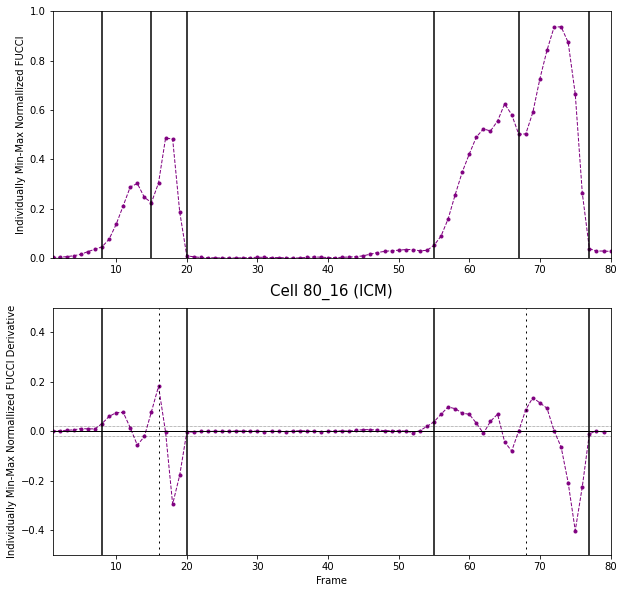

In [37]:
test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, [80, 16], makeplots = True, savefig = [False, plot_path])

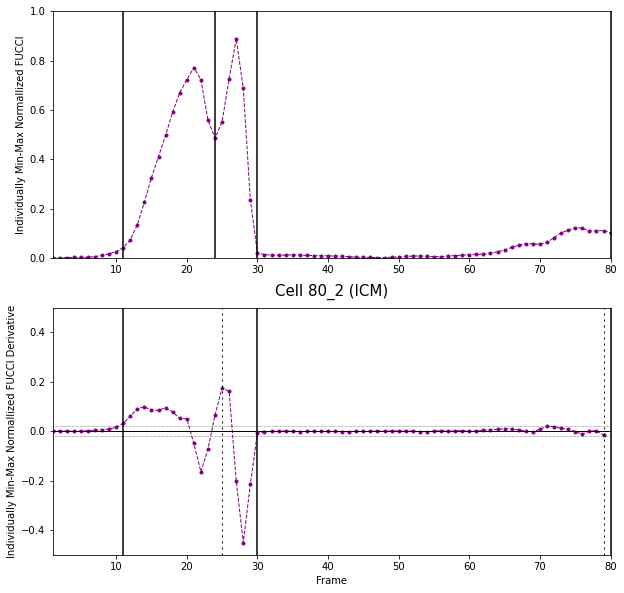

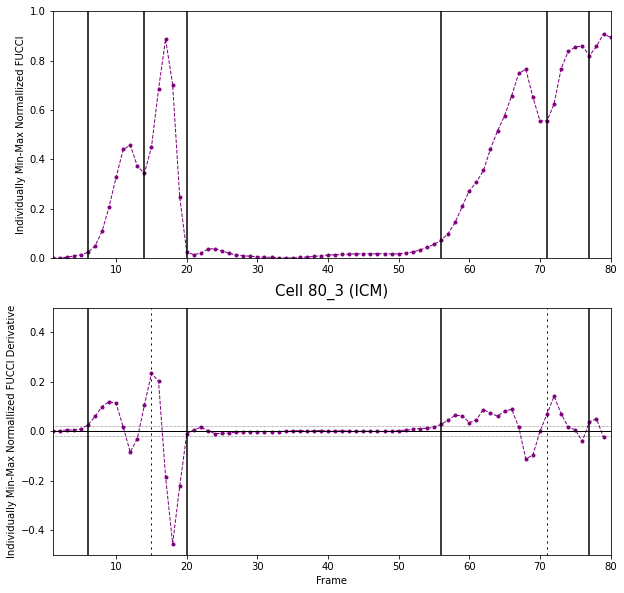

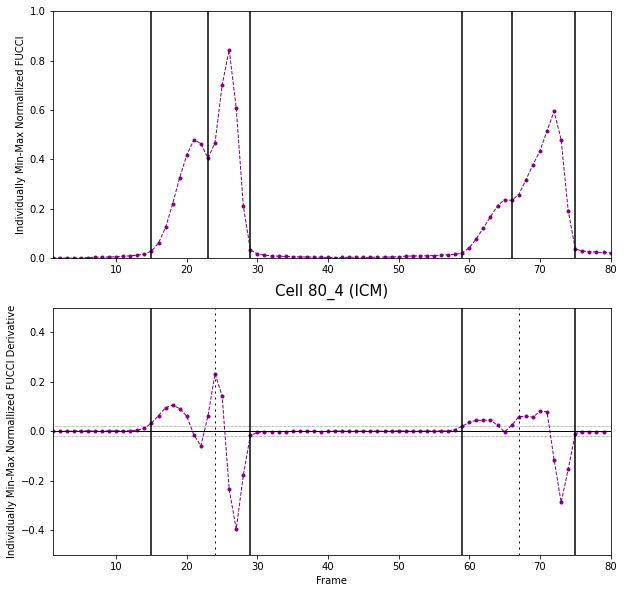

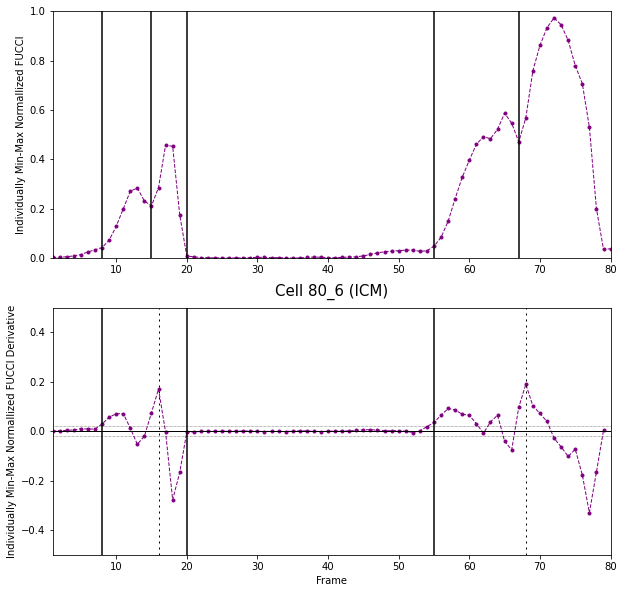

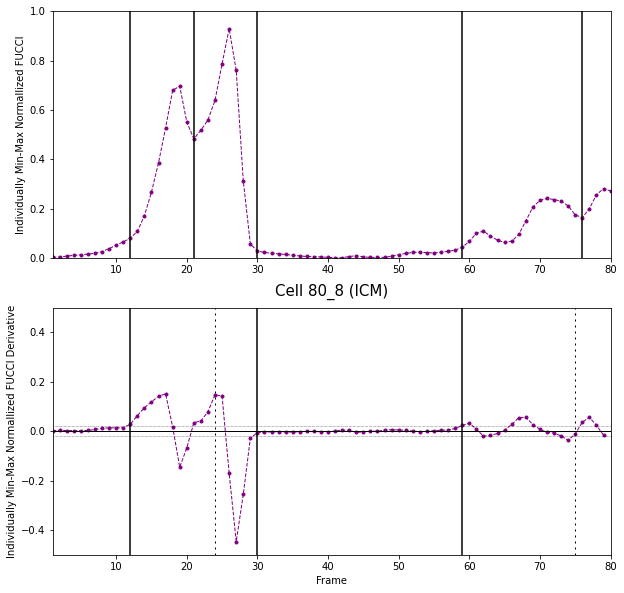

...

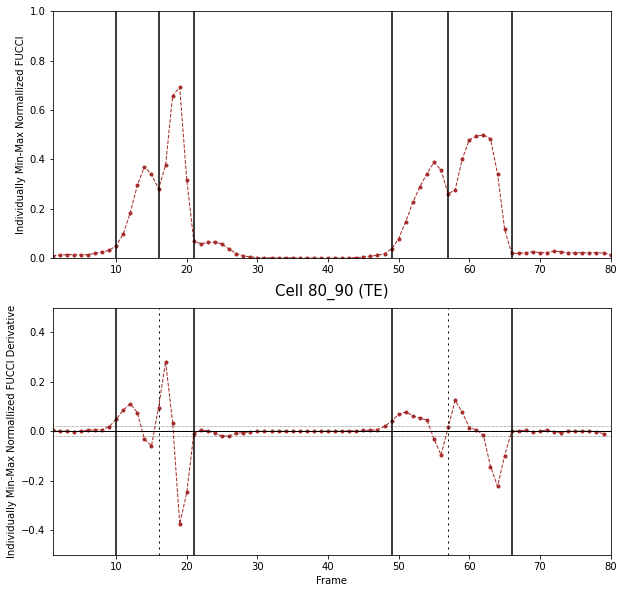

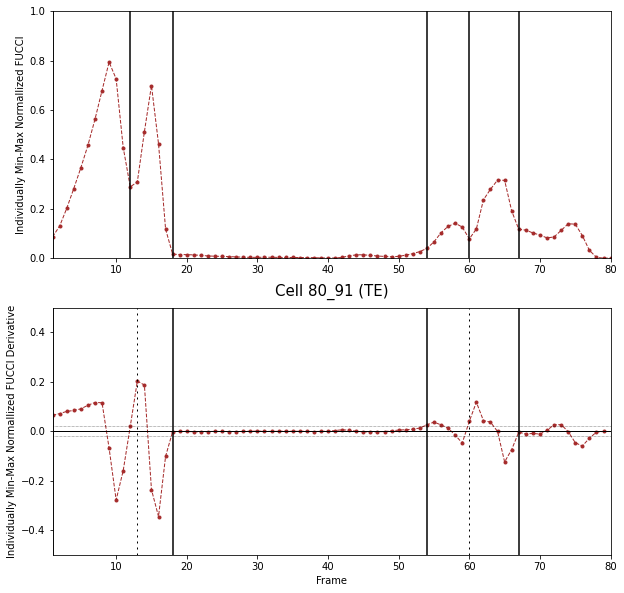

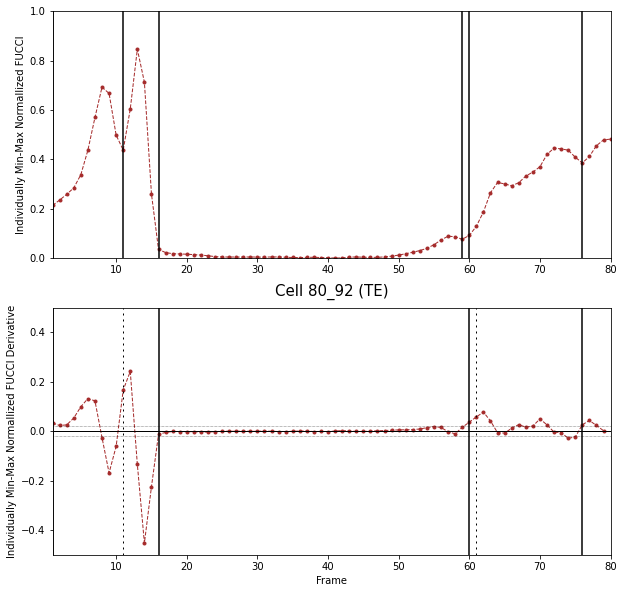

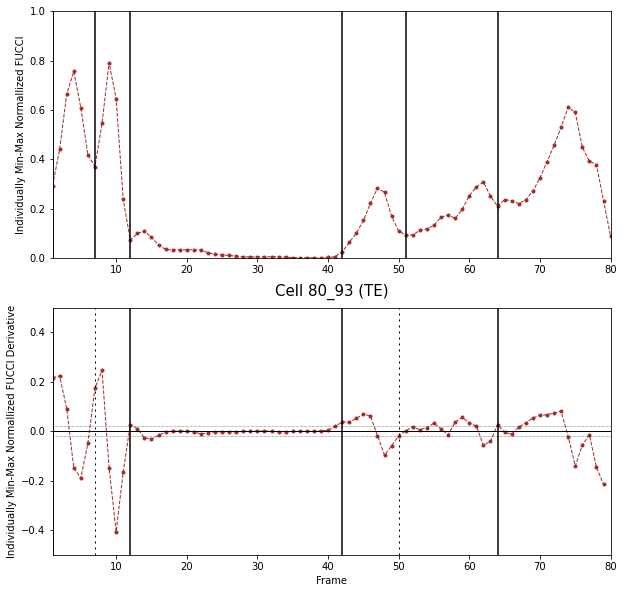

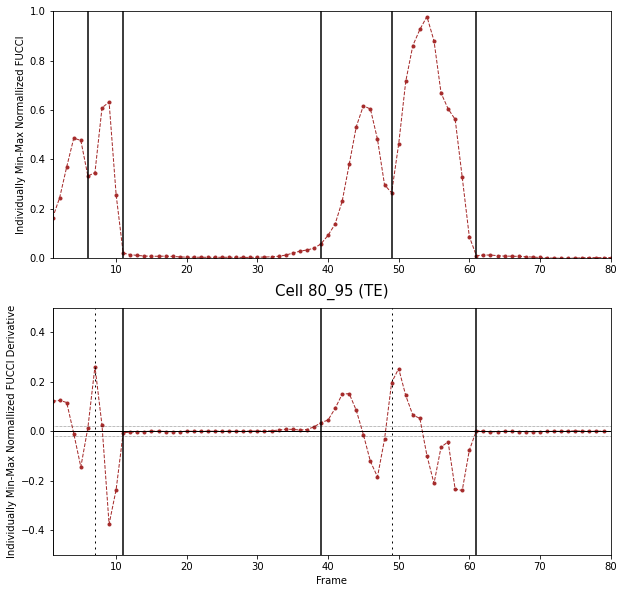

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


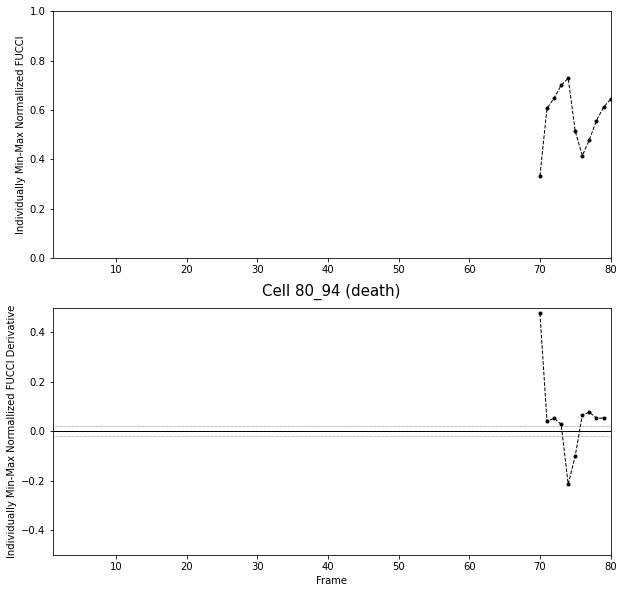

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


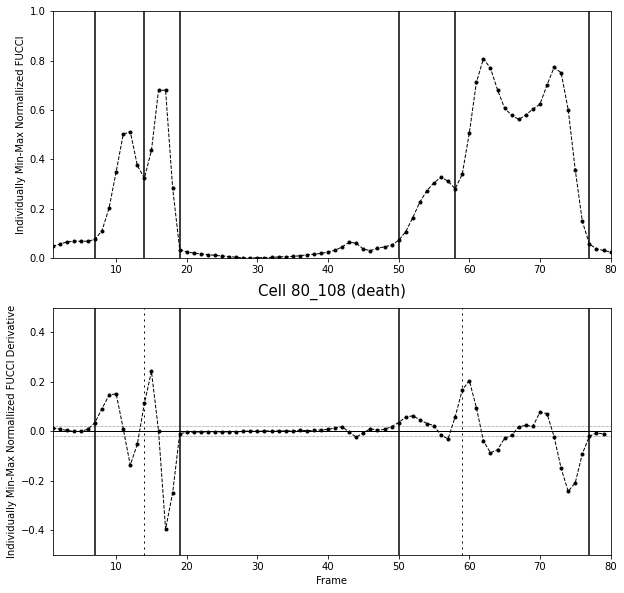

Fate-based color selection failed, defaulted to black
Fate-based color selection failed, defaulted to black


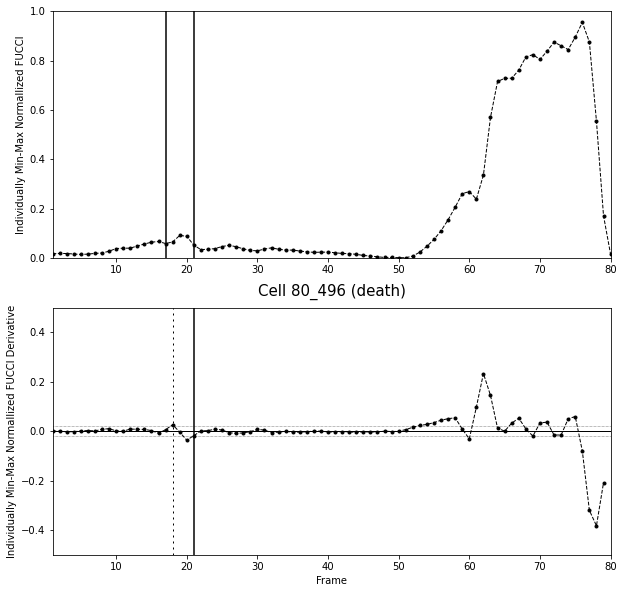

In [61]:
# make plots for all cells
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, cell[0], makeplots = True, savefig = [True, plot_path])

In [62]:
all_calls = []
all_cells = []
for indiv_fate in fate_data:
    for cell in indiv_fate[1]:
        test_calls = annotate_trace(indiv_norm_traces, indiv_norm_derivs, cell[0], makeplots = False, savefig = [False, plot_path])
        all_calls.append(test_calls)
        all_cells.append(cell[0])
        print(cell[0], '>>', test_calls)

[80, 2] >> [[11], [24], [30, 80]]
[80, 3] >> [[6, 56], [14, 71], [20, 77]]
[80, 4] >> [[15, 59], [23, 66], [29, 75]]
[80, 6] >> [[8, 55], [15, 67], [20]]
[80, 8] >> [[12, 59], [21, 76], [30]]
[80, 13] >> [[6, 56], [14, 70], [20]]
[80, 14] >> [[15], [23, 62], [30, 75]]
[80, 16] >> [[8, 55], [15, 67], [20, 77]]
[80, 19] >> [[11, 70], [24, 77], [30]]
[80, 23] >> [[8, 56], [14, 66], [20, 75]]
[80, 24] >> [[12, 58], [22, 61], [30, 75]]
[80, 26] >> [[11], [24], [30, 80]]
[80, 27] >> [[6, 54], [14, 65], [20, 78]]
[80, 30] >> [[23], [31], [42]]
[80, 32] >> [[7, 57], [15, 67], [20, 77]]
[80, 39] >> [[12, 59], [21, 66], [29]]
[80, 55] >> [[7, 57], [15, 67], [20]]
[80, 56] >> [[12], [31], [39]]
[80, 58] >> [[11, 70], [24, 77], [30]]
[80, 59] >> [[13, 66], [22, 71], [29, 78]]
[80, 65] >> [[17, 51], [29, 47], [38, 71]]
[80, 70] >> [[8, 52], [15, 65], [20, 73]]
[80, 76] >> [[51], [36, 75], [34]]
[80, 84] >> [[8, 52], [15, 65], [20, 72]]
[80, 99] >> [[13, 66], [22, 70], [29, 78]]
[80, 100] >> [[12, 5

In [63]:
def label_annotations_forward(events, first_division = 64, check_initial_g2 = True): # transforms list of trace annotations into labeled cell cycle phases
    new_events = copy.deepcopy(events)
    stage_events = [str(first_division) + 'cellstage']
    mitosis = 0
    initial_g2_acquired = False
    
    if check_initial_g2:
        if len(events[0]) > 0 and events[0][0] < events[1][0]:
            if events[0][0] > 1:
                first_division = int(first_division / 2)
                stage_events = [str(first_division) + 'cellstage']
                g2 = events[0][0]
                stage_events.append(g2)
                new_events[0].pop(new_events[0].index(g2))
            else:
                first_division = int(first_division / 2)
                stage_events = []
                new_events[0].pop(0)
            initial_g2_acquired = True
    
    if not initial_g2_acquired:
        if len(events[1]) > 0:
            mitosis = events[1][0]
            stage_events.append(mitosis)
            new_events[1].pop(0)

        if len(events[2]) > 0:
            g1_tmp = 999
            for event in events[2]:
                if (event > mitosis) and ((event - mitosis) < (g1_tmp - mitosis)):
                    g1_tmp = event
            if g1_tmp < 999:
                g1 = g1_tmp
                stage_events.append(g1)
                new_events[2].pop(new_events[2].index(g1))

        if len(events[0]) > 0:
            g2_tmp = 999
            for event in events[0]:
                if (event > mitosis) and ((event - mitosis) < (g2_tmp - mitosis)):
                    g2_tmp = event
            if g2_tmp < 999:
                g2 = g2_tmp
                stage_events.append(g2)
                new_events[0].pop(new_events[0].index(g2))
    
    if len(stage_events) == 1:
        out = []
    else:
        out = label_annotations_forward(new_events, int(first_division * 2), check_initial_g2 = False)
        out.append(stage_events)
        
    return out

In [64]:
testrun = label_annotations_forward(all_calls[1])
testrun.reverse()

In [65]:
print(all_calls[1])
print(testrun)

[[6, 56], [14, 71], [20, 77]]
[['32cellstage', 6], ['64cellstage', 14, 20, 56], ['128cellstage', 71, 77]]


In [66]:
counter = 0
annotations = []

for calls in all_calls:
    tmp = label_annotations_forward(calls)
    tmp.reverse()
    annotations.append(tmp)
    
    cell_id = str(all_cells[counter][0]) + '_' + str(all_cells[counter][1])
    tmp = [cell_id] + tmp
    print(tmp)
    counter += 1

['80_2', ['32cellstage', 11], ['64cellstage', 24, 30], ['128cellstage', 80]]
['80_3', ['32cellstage', 6], ['64cellstage', 14, 20, 56], ['128cellstage', 71, 77]]
['80_4', ['32cellstage', 15], ['64cellstage', 23, 29, 59], ['128cellstage', 66, 75]]
['80_6', ['32cellstage', 8], ['64cellstage', 15, 20, 55], ['128cellstage', 67]]
['80_8', ['32cellstage', 12], ['64cellstage', 21, 30, 59], ['128cellstage', 76]]
['80_13', ['32cellstage', 6], ['64cellstage', 14, 20, 56], ['128cellstage', 70]]
['80_14', ['32cellstage', 15], ['64cellstage', 23, 30], ['128cellstage', 62, 75]]
['80_16', ['32cellstage', 8], ['64cellstage', 15, 20, 55], ['128cellstage', 67, 77]]
['80_19', ['32cellstage', 11], ['64cellstage', 24, 30, 70], ['128cellstage', 77]]
['80_23', ['32cellstage', 8], ['64cellstage', 14, 20, 56], ['128cellstage', 66, 75]]
['80_24', ['32cellstage', 12], ['64cellstage', 22, 30, 58], ['128cellstage', 61, 75]]
['80_26', ['32cellstage', 11], ['64cellstage', 24, 30], ['128cellstage', 80]]
['80_27', ['32

In [67]:
print(annotations[0])

[['32cellstage', 11], ['64cellstage', 24, 30], ['128cellstage', 80]]


In [68]:
anno_writer = []
counter = 0
for anno in annotations:
    new_anno = [str(all_cells[counter][0]) + '_' + str(all_cells[counter][1])]

    cnt = 0
    for stage in anno:
        if len(stage) < 1:
            new_anno.append(-1)
        else:
            for i in range(len(stage) - 1):
                new_anno.append(stage[i + 1])
            if cnt == len(anno) - 1:
                for i in range(4 - len(stage)):
                    new_anno.append(-1)
        cnt += 1
        
    anno_writer.append(new_anno)
    print(new_anno)
    counter += 1

['80_2', 11, 24, 30, 80, -1, -1]
['80_3', 6, 14, 20, 56, 71, 77, -1]
['80_4', 15, 23, 29, 59, 66, 75, -1]
['80_6', 8, 15, 20, 55, 67, -1, -1]
['80_8', 12, 21, 30, 59, 76, -1, -1]
['80_13', 6, 14, 20, 56, 70, -1, -1]
['80_14', 15, 23, 30, 62, 75, -1]
['80_16', 8, 15, 20, 55, 67, 77, -1]
['80_19', 11, 24, 30, 70, 77, -1, -1]
['80_23', 8, 14, 20, 56, 66, 75, -1]
['80_24', 12, 22, 30, 58, 61, 75, -1]
['80_26', 11, 24, 30, 80, -1, -1]
['80_27', 6, 14, 20, 54, 65, 78, -1]
['80_30', 23, 31, 42, -1]
['80_32', 7, 15, 20, 57, 67, 77, -1]
['80_39', 12, 21, 29, 59, 66, -1, -1]
['80_55', 7, 15, 20, 57, 67, -1, -1]
['80_56', 12, 31, 39, -1]
['80_58', 11, 24, 30, 70, 77, -1, -1]
['80_59', 13, 22, 29, 66, 71, 78, -1]
['80_65', 17, 29, 38, 51, 47, 71, -1]
['80_70', 8, 15, 20, 52, 65, 73, -1]
['80_76', 36, 51, 75, 34, -1, -1]
['80_84', 8, 15, 20, 52, 65, 72, -1]
['80_99', 13, 22, 29, 66, 70, 78, -1]
['80_100', 12, 22, 29, 58, 61, 75, -1]
['80_102', 14, 22, 28, 57, 62, 75, -1]
['80_107', 12, 21, 30, 59, 

In [69]:
out_file = os.path.join(stack_path, 'annotations.csv')
with open(out_file, 'w', newline='') as csvfile:
    csv_writer = csv.writer(csvfile)
    csv_writer.writerows(anno_writer)

In [70]:
print(cells_called)

[['80' '2' 'ICM']
 ['80' '3' 'ICM']
 ['80' '4' 'ICM']
 ['80' '5' 'TE']
 ['80' '6' 'ICM']
 ['80' '7' 'TE']
 ['80' '8' 'ICM']
 ['80' '9' 'TE']
 ['80' '10' 'TE']
 ['80' '11' 'TE']
 ['80' '12' 'TE']
 ['80' '13' 'ICM']
 ['80' '14' 'ICM']
 ['80' '15' 'TE']
 ['80' '16' 'ICM']
 ['80' '17' 'TE']
 ['80' '18' 'TE']
 ['80' '19' 'ICM']
 ['80' '20' 'TE']
 ['80' '21' 'TE']
 ['80' '22' 'TE']
 ['80' '23' 'ICM']
 ['80' '24' 'ICM']
 ['80' '26' 'ICM']
 ['80' '27' 'ICM']
 ['80' '28' 'TE']
 ['80' '29' 'TE']
 ['80' '30' 'ICM']
 ['80' '31' 'TE']
 ['80' '32' 'ICM']
 ['80' '33' 'TE']
 ['80' '34' 'TE']
 ['80' '35' 'TE']
 ['80' '36' 'TE']
 ['80' '37' 'TE']
 ['80' '38' 'TE']
 ['80' '39' 'ICM']
 ['80' '40' 'TE']
 ['80' '41' 'TE']
 ['80' '42' 'TE']
 ['80' '43' 'TE']
 ['80' '44' 'TE']
 ['80' '45' 'TE']
 ['80' '46' 'TE']
 ['80' '47' 'TE']
 ['80' '48' 'TE']
 ['80' '49' 'TE']
 ['80' '50' 'TE']
 ['80' '51' 'TE']
 ['80' '52' 'TE']
 ['80' '53' 'TE']
 ['80' '54' 'TE']
 ['80' '55' 'ICM']
 ['80' '56' 'ICM']
 ['80' '57' 'TE']
